# Full Aggregate

[Nasal Biopsies Preprocessing](#Nasal-Biopsies)  
[Nasal Brushings Preprocessing](#Nasal-Brushings)  
[Proximal Biopsies Preprocessing](#Proximal-Biopsies)  
[Intermediate Biopsies Preprocessing](#Intermediate-Biopsies)  
[Distal Brushings Preprocessing](#Distal-Brushings)  
[Concatenate Full Dataset](#Concatenate-full-dataset) 

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

scanpy==1.4 anndata==0.6.18 numpy==1.16.1 scipy==1.2.1 pandas==0.24.1 scikit-learn==0.20.2 statsmodels==0.9.0 


In [2]:
def remove_RB_genes(
    df,
    path_to_RB_genes_file = '/home/deprez/HCA/Script_Python/RB_genes'
):
    """Removes all columns of RB genes as listed in the RB gene file.
    RB_genes_file should contain gene names, one gene name per line.
    Returns RB gene-depleted df, pd.Series with number of counts removed 
    per cell, and a list of RB genes that were in the df."""
    with open(path_to_RB_genes_file,'r') as file:
        lines = file.readlines()
    genes = [x.rstrip('\n') for x in lines]
    RB_genes_in_df = []
    df_genes = df.columns
    for gene in genes:
        if gene in df_genes:
            RB_genes_in_df.append(gene)
    # df_genes = df.columns
    # ribosomal_genes = []
    # for GENE in df_genes:
    #     if GENE[:3] in ['RPL','RPS']:
    #         ribosomal_genes.append(GENE)
    # store the number of RB molecules per cell in a Series object with cell labels as indices
    counts_removed_per_cell = pd.Series(index = df.index)
    for cell in df.index:
        counts_removed_per_cell[cell] = sum(df.loc[cell][RB_genes_in_df])
    # now drop all columns with RB genes:
    df_RB_depleted = df.drop(columns = RB_genes_in_df)
    return df_RB_depleted, counts_removed_per_cell, RB_genes_in_df


In [3]:
sc.settings.set_figure_params(dpi=80)

In [4]:
os.chdir('/home/deprez/HCA/DataReal/')
outsPath = 'outs/filtered_gene_bc_matrices/ucagenomix-cellranger-hg19-1.3.0/'

# Nasal Biopsies
[Back to top](#Full-Aggregate)

In [5]:
D322_Biop_Nas1 = sc.read_10x_mtx(
    './D322_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Nas1.var_names_make_unique()
D322_Biop_Nas1.obs['manip'] = 'D322_Biop_Nas1'
D322_Biop_Nas1.obs['position'] = 'Nasal'
D322_Biop_Nas1.obs['method'] = 'Biopsy'
D322_Biop_Nas1.obs['donor'] = 'D322'
D322_Biop_Nas1.obs['name'] = ['D322_Biop_Nas1_' + s for s in list(D322_Biop_Nas1.obs.index)]
D322_Biop_Nas1.obs_names = D322_Biop_Nas1.obs['name']
D322_Biop_Nas1

... reading from cache file ./cache/D322_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1797 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

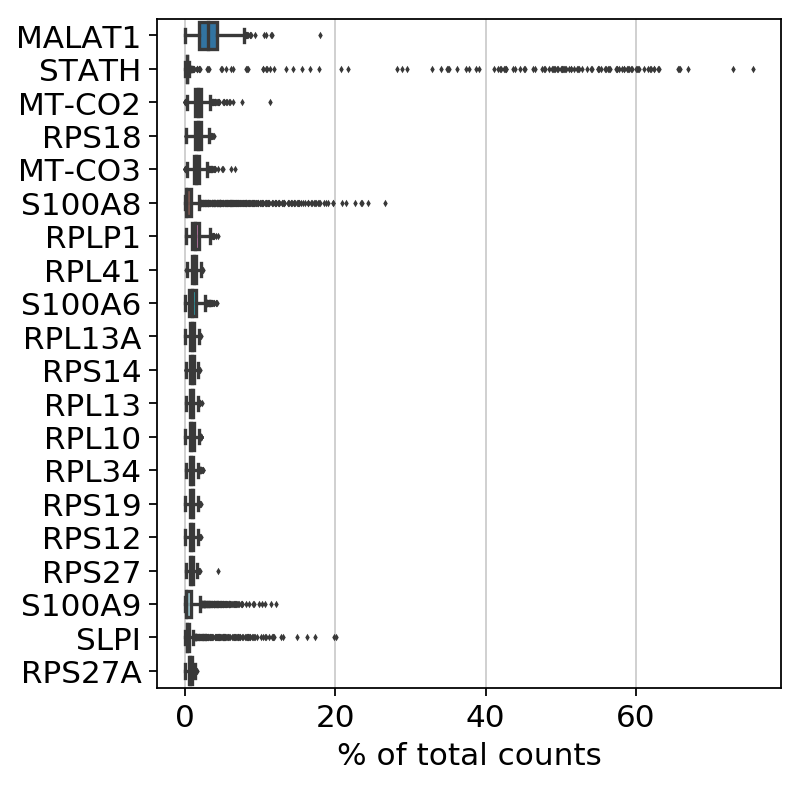

In [6]:
sc.pl.highest_expr_genes(D322_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


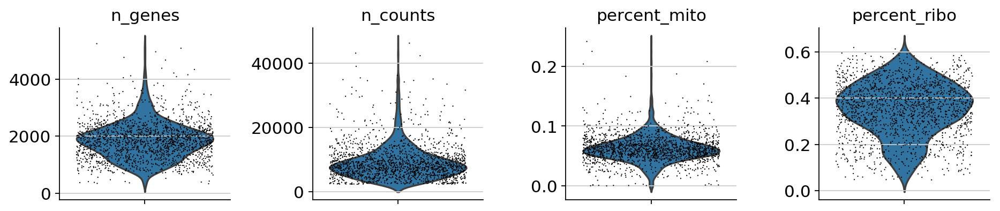

In [7]:
sc.pp.filter_cells(D322_Biop_Nas1, min_genes=0)
mito_genes = D322_Biop_Nas1.var_names.str.startswith('MT-')
D322_Biop_Nas1.obs['percent_mito'] = np.sum(
    D322_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Nas1.X, axis=1).A1
D322_Biop_Nas1.obs['n_counts'] = D322_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Nas1.to_df())
ribo_genes = D322_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D322_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Nas1.X, axis=1).A1
D322_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [8]:
sc.pp.filter_cells(D322_Biop_Nas1, min_genes=500)
D322_Biop_Nas1 = D322_Biop_Nas1[D322_Biop_Nas1.obs['n_counts'] < 40000, :]
D322_Biop_Nas1 = D322_Biop_Nas1[D322_Biop_Nas1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D322_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Nas1) # log transform the data
D322_Biop_Nas1.raw = D322_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 10 cells that have less than 500 genes expressed


In [9]:
D322_Biop_Nas1 = D322_Biop_Nas1[:, D322_Biop_Nas1.var['ribo_genes']]
D322_Biop_Nas1

View of AnnData object with n_obs × n_vars = 1780 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [10]:
D339_Biop_Nas1 = sc.read_10x_mtx(
    './D339_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Nas1.var_names_make_unique()
D339_Biop_Nas1.obs['manip'] = 'D339_Biop_Nas1'
D339_Biop_Nas1.obs['position'] = 'Nasal'
D339_Biop_Nas1.obs['method'] = 'Biopsy'
D339_Biop_Nas1.obs['donor'] = 'D339'
D339_Biop_Nas1.obs['name'] = ['D339_Biop_Nas1_' + s for s in list(D339_Biop_Nas1.obs.index)]
D339_Biop_Nas1.obs_names = D339_Biop_Nas1.obs['name']
D339_Biop_Nas1

... reading from cache file ./cache/D339_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1917 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

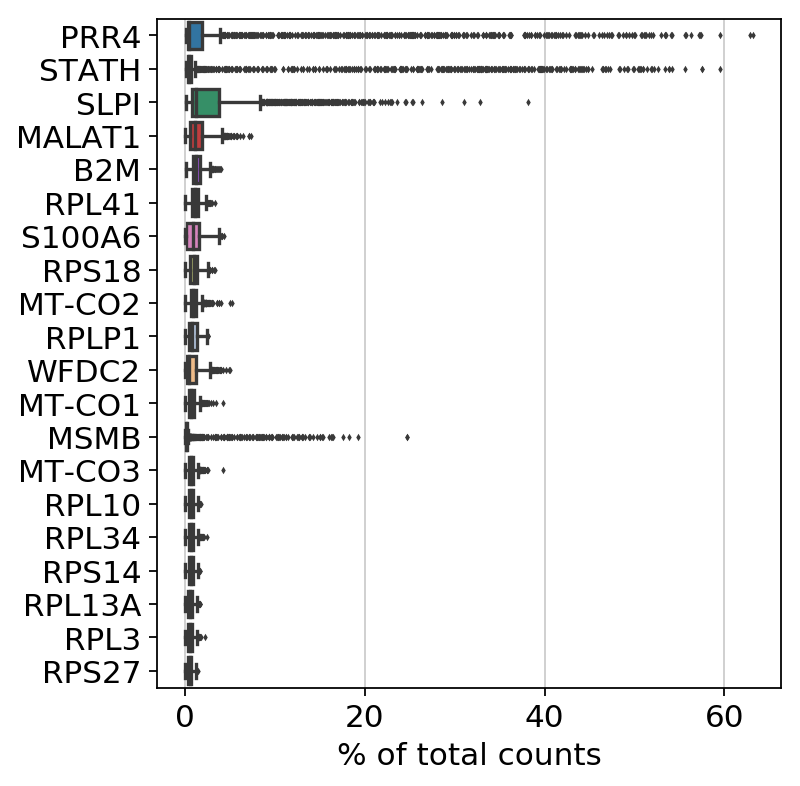

In [11]:
sc.pl.highest_expr_genes(D339_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


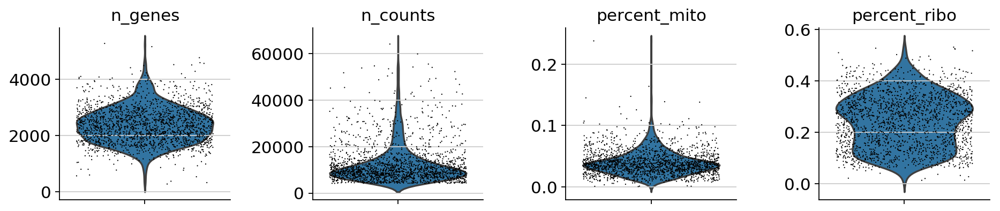

In [12]:
sc.pp.filter_cells(D339_Biop_Nas1, min_genes=0)
mito_genes = D339_Biop_Nas1.var_names.str.startswith('MT-')
D339_Biop_Nas1.obs['percent_mito'] = np.sum(
    D339_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Nas1.X, axis=1).A1
D339_Biop_Nas1.obs['n_counts'] = D339_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Nas1.to_df())
ribo_genes = D339_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D339_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Nas1.X, axis=1).A1
D339_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [13]:
sc.pp.filter_cells(D339_Biop_Nas1, min_genes=500)
D339_Biop_Nas1 = D339_Biop_Nas1[D339_Biop_Nas1.obs['n_counts'] < 40000, :]
D339_Biop_Nas1 = D339_Biop_Nas1[D339_Biop_Nas1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D339_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Nas1) # log transform the data
D339_Biop_Nas1.raw = D339_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 3 cells that have less than 500 genes expressed


In [14]:
D339_Biop_Nas1 = D339_Biop_Nas1[:, D339_Biop_Nas1.var['ribo_genes']]
D339_Biop_Nas1

View of AnnData object with n_obs × n_vars = 1879 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [15]:
D344_Biop_Nas1 = sc.read_10x_mtx(
    './D344_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Nas1.var_names_make_unique()
D344_Biop_Nas1.obs['manip'] = 'D344_Biop_Nas1'
D344_Biop_Nas1.obs['position'] = 'Nasal'
D344_Biop_Nas1.obs['method'] = 'Biopsy'
D344_Biop_Nas1.obs['donor'] = 'D344'
D344_Biop_Nas1.obs['name'] = ['D344_Biop_Nas1_' + s for s in list(D344_Biop_Nas1.obs.index)]
D344_Biop_Nas1.obs_names = D344_Biop_Nas1.obs['name']
D344_Biop_Nas1

... reading from cache file ./cache/D344_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2121 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

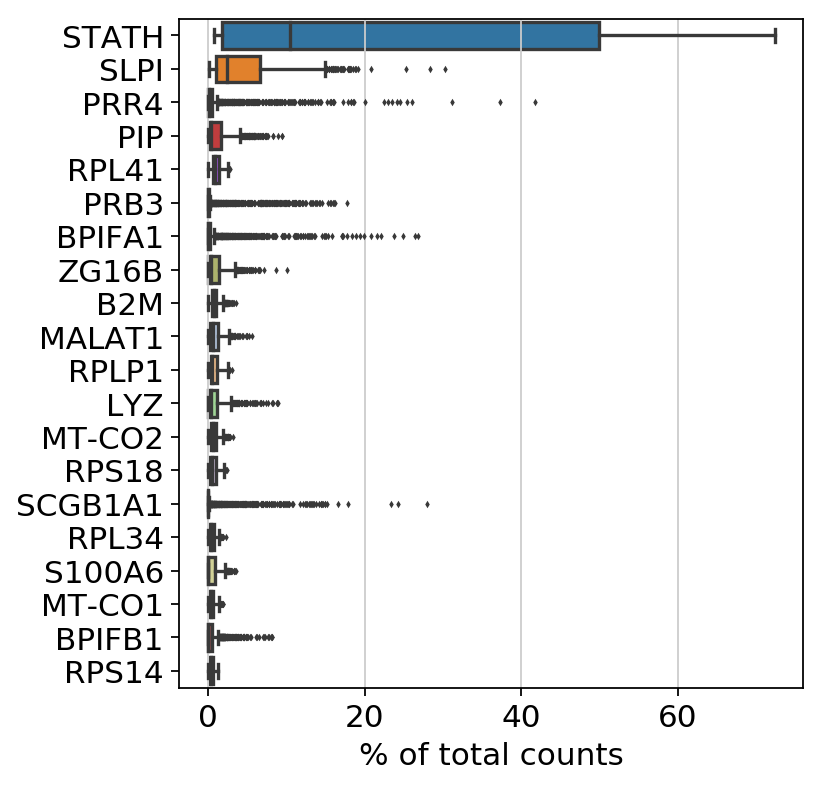

In [16]:
sc.pl.highest_expr_genes(D344_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


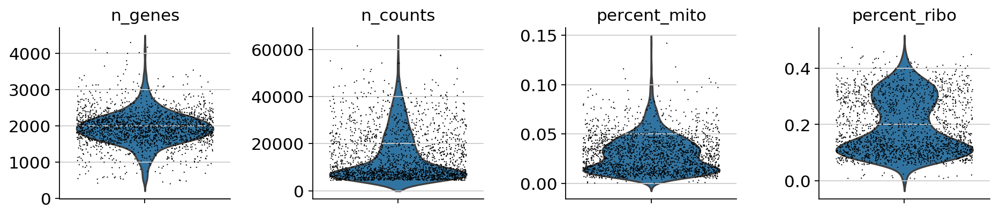

In [17]:
sc.pp.filter_cells(D344_Biop_Nas1, min_genes=0)
mito_genes = D344_Biop_Nas1.var_names.str.startswith('MT-')
D344_Biop_Nas1.obs['percent_mito'] = np.sum(
    D344_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Nas1.X, axis=1).A1
D344_Biop_Nas1.obs['n_counts'] = D344_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Nas1.to_df())
ribo_genes = D344_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D344_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Nas1.X, axis=1).A1
D344_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [18]:
sc.pp.filter_cells(D344_Biop_Nas1, min_genes=500)
D344_Biop_Nas1 = D344_Biop_Nas1[D344_Biop_Nas1.obs['n_counts'] < 50000, :]
D344_Biop_Nas1 = D344_Biop_Nas1[D344_Biop_Nas1.obs['percent_mito'] < 0.1, :]
sc.pp.normalize_per_cell(D344_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Nas1) # log transform the data
D344_Biop_Nas1.raw = D344_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 6 cells that have less than 500 genes expressed


In [19]:
D344_Biop_Nas1 = D344_Biop_Nas1[:, D344_Biop_Nas1.var['ribo_genes']]
D344_Biop_Nas1

View of AnnData object with n_obs × n_vars = 2095 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [20]:
D345_Biop_Nas1 = sc.read_10x_mtx(
    './D345_Biop_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D345_Biop_Nas1.var_names_make_unique()
D345_Biop_Nas1.obs['manip'] = 'D345_Biop_Nas1'
D345_Biop_Nas1.obs['position'] = 'Nasal'
D345_Biop_Nas1.obs['method'] = 'Biopsy'
D345_Biop_Nas1.obs['donor'] = 'D345'
D345_Biop_Nas1.obs['name'] = ['D345_Biop_Nas1_' + s for s in list(D345_Biop_Nas1.obs.index)]
D345_Biop_Nas1.obs_names = D345_Biop_Nas1.obs['name']
D345_Biop_Nas1

... reading from cache file ./cache/D345_Biop_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3259 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

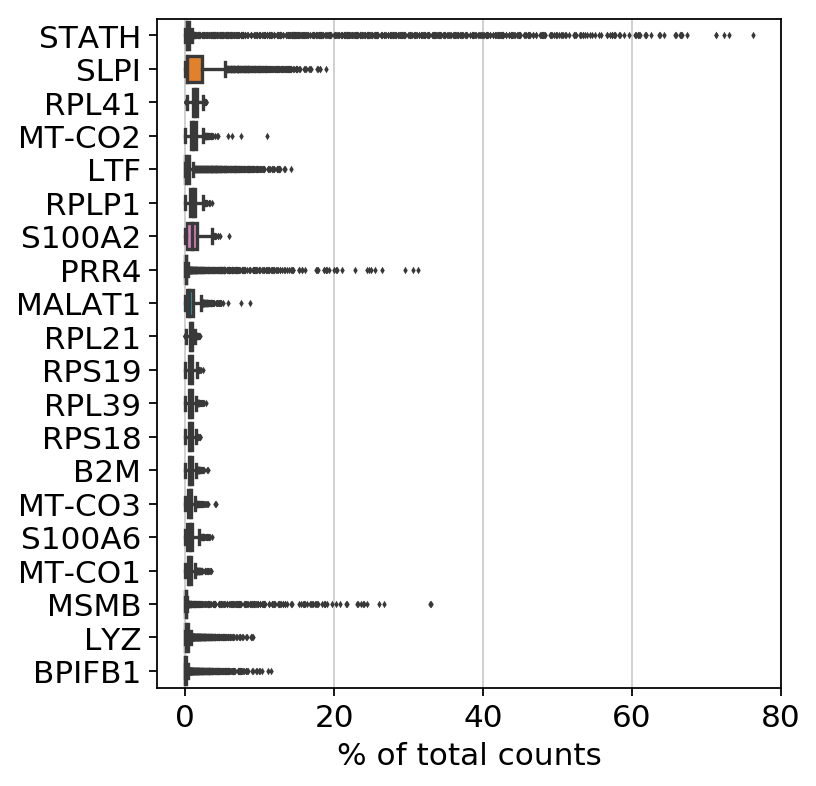

In [21]:
sc.pl.highest_expr_genes(D345_Biop_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


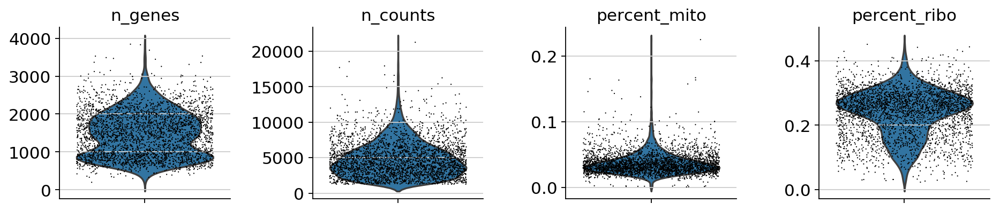

In [22]:
sc.pp.filter_cells(D345_Biop_Nas1, min_genes=0)
mito_genes = D345_Biop_Nas1.var_names.str.startswith('MT-')
D345_Biop_Nas1.obs['percent_mito'] = np.sum(
    D345_Biop_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D345_Biop_Nas1.X, axis=1).A1
D345_Biop_Nas1.obs['n_counts'] = D345_Biop_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D345_Biop_Nas1.to_df())
ribo_genes = D345_Biop_Nas1.to_df().columns.isin(RB_genes_in_df)
D345_Biop_Nas1.obs['percent_ribo'] = np.sum(
    D345_Biop_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D345_Biop_Nas1.X, axis=1).A1
D345_Biop_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D345_Biop_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [23]:
sc.pp.filter_cells(D345_Biop_Nas1, min_genes=500)
D345_Biop_Nas1 = D345_Biop_Nas1[D345_Biop_Nas1.obs['n_counts'] < 20000, :]
D345_Biop_Nas1 = D345_Biop_Nas1[D345_Biop_Nas1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D345_Biop_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D345_Biop_Nas1) # log transform the data
D345_Biop_Nas1.raw = D345_Biop_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 32 cells that have less than 500 genes expressed


In [24]:
D345_Biop_Nas1 = D345_Biop_Nas1[:, D345_Biop_Nas1.var['ribo_genes']]
D345_Biop_Nas1

View of AnnData object with n_obs × n_vars = 3225 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

# Nasal Brushings
[Back to top](#Full-Aggregate)

In [25]:
D353_Brus_Nas1 = sc.read_10x_mtx(
    './D353_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Brus_Nas1.var_names_make_unique()
D353_Brus_Nas1.obs['manip'] = 'D353_Brus_Nas1'
D353_Brus_Nas1.obs['position'] = 'Nasal'
D353_Brus_Nas1.obs['method'] = 'Brushing'
D353_Brus_Nas1.obs['donor'] = 'D353'
D353_Brus_Nas1.obs['name'] = ['D353_Brus_Nas1_' + s for s in list(D353_Brus_Nas1.obs.index)]
D353_Brus_Nas1.obs_names = D353_Brus_Nas1.obs['name']
D353_Brus_Nas1

... reading from cache file ./cache/D353_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 5154 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

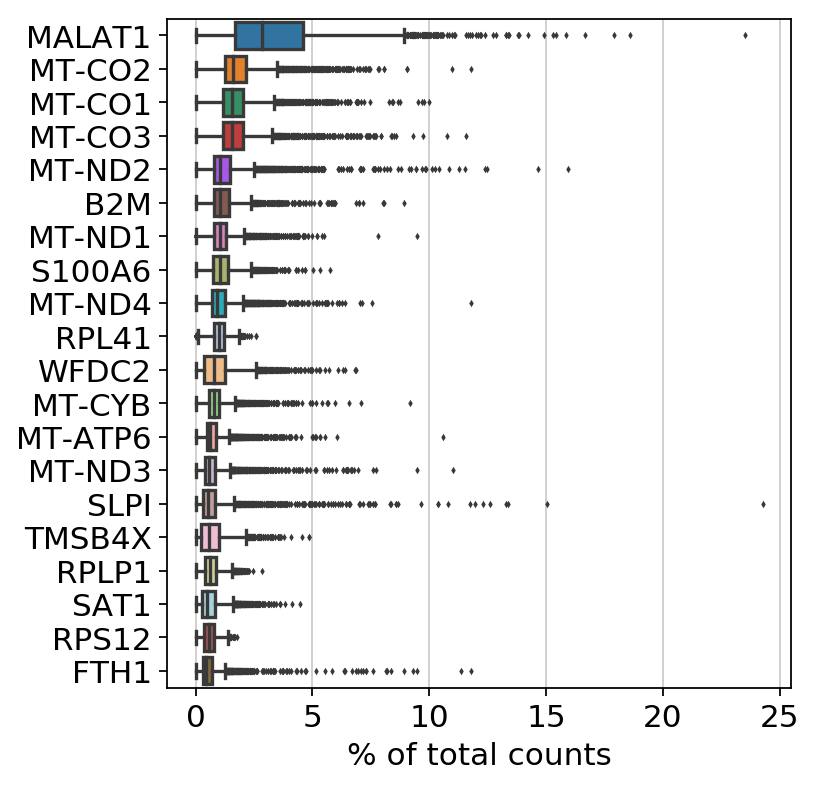

In [26]:
sc.pl.highest_expr_genes(D353_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


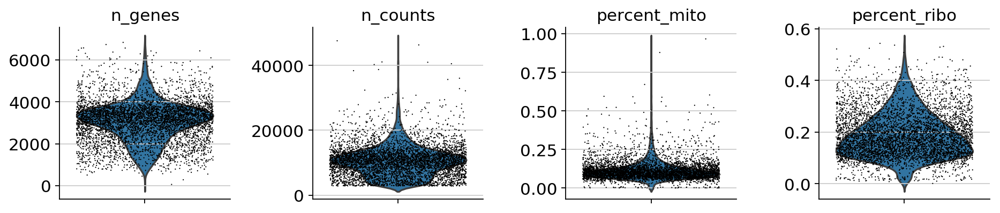

In [27]:
sc.pp.filter_cells(D353_Brus_Nas1, min_genes=0)
mito_genes = D353_Brus_Nas1.var_names.str.startswith('MT-')
D353_Brus_Nas1.obs['percent_mito'] = np.sum(
    D353_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Brus_Nas1.X, axis=1).A1
D353_Brus_Nas1.obs['n_counts'] = D353_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Brus_Nas1.to_df())
ribo_genes = D353_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D353_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D353_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Brus_Nas1.X, axis=1).A1
D353_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [28]:
sc.pp.filter_cells(D353_Brus_Nas1, min_genes=500)
D353_Brus_Nas1 = D353_Brus_Nas1[D353_Brus_Nas1.obs['n_counts'] < 40000, :]
D353_Brus_Nas1 = D353_Brus_Nas1[D353_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D353_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Brus_Nas1) # log transform the data
D353_Brus_Nas1.raw = D353_Brus_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 3 cells that have less than 500 genes expressed


In [29]:
D353_Brus_Nas1 = D353_Brus_Nas1[:, D353_Brus_Nas1.var['ribo_genes']]
D353_Brus_Nas1

View of AnnData object with n_obs × n_vars = 5131 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [30]:
D363_Brus_Nas1 = sc.read_10x_mtx(
    './D363_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Brus_Nas1.var_names_make_unique()
D363_Brus_Nas1.obs['manip'] = 'D363_Brus_Nas1'
D363_Brus_Nas1.obs['position'] = 'Nasal'
D363_Brus_Nas1.obs['method'] = 'Brushing'
D363_Brus_Nas1.obs['donor'] = 'D363'
D363_Brus_Nas1.obs['name'] = ['D363_Brus_Nas1_' + s for s in list(D363_Brus_Nas1.obs.index)]
D363_Brus_Nas1.obs_names = D363_Brus_Nas1.obs['name']
D363_Brus_Nas1

... reading from cache file ./cache/D363_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3505 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

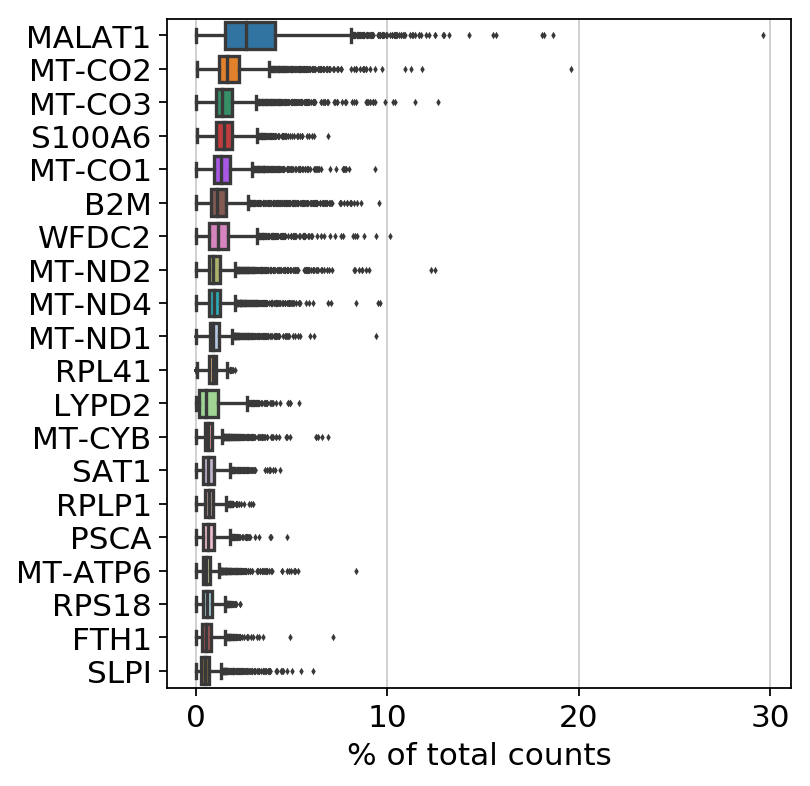

In [31]:
sc.pl.highest_expr_genes(D363_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


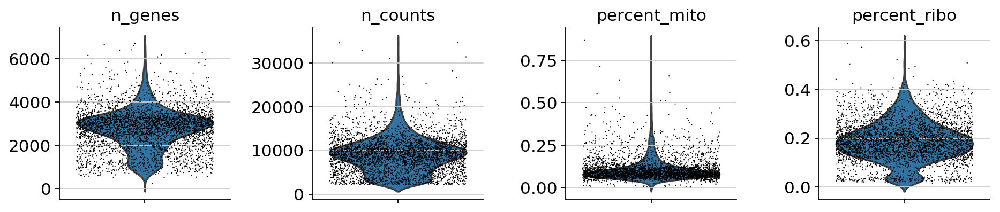

In [32]:
sc.pp.filter_cells(D363_Brus_Nas1, min_genes=0)
mito_genes = D363_Brus_Nas1.var_names.str.startswith('MT-')
D363_Brus_Nas1.obs['percent_mito'] = np.sum(
    D363_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Brus_Nas1.X, axis=1).A1
D363_Brus_Nas1.obs['n_counts'] = D363_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Brus_Nas1.to_df())
ribo_genes = D363_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D363_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D363_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Brus_Nas1.X, axis=1).A1
D363_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [33]:
sc.pp.filter_cells(D363_Brus_Nas1, min_genes=500)
D363_Brus_Nas1 = D363_Brus_Nas1[D363_Brus_Nas1.obs['n_counts'] < 30000, :]
D363_Brus_Nas1 = D363_Brus_Nas1[D363_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D363_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Brus_Nas1) # log transform the data
D363_Brus_Nas1.raw = D363_Brus_Nas1 # freeze the object (for later use of the raw state of it)

filtered out 1 cells that have less than 500 genes expressed


In [34]:
D363_Brus_Nas1 = D363_Brus_Nas1[:, D363_Brus_Nas1.var['ribo_genes']]
D363_Brus_Nas1

View of AnnData object with n_obs × n_vars = 3490 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [35]:
D367_Brus_Nas1 = sc.read_10x_mtx(
    './D367_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Brus_Nas1.var_names_make_unique()
D367_Brus_Nas1.obs['manip'] = 'D367_Brus_Nas1'
D367_Brus_Nas1.obs['position'] = 'Nasal'
D367_Brus_Nas1.obs['method'] = 'Brushing'
D367_Brus_Nas1.obs['donor'] = 'D367'
D367_Brus_Nas1.obs['name'] = ['D367_Brus_Nas1_' + s for s in list(D367_Brus_Nas1.obs.index)]
D367_Brus_Nas1.obs_names = D367_Brus_Nas1.obs['name']
D367_Brus_Nas1

... reading from cache file ./cache/D367_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2596 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

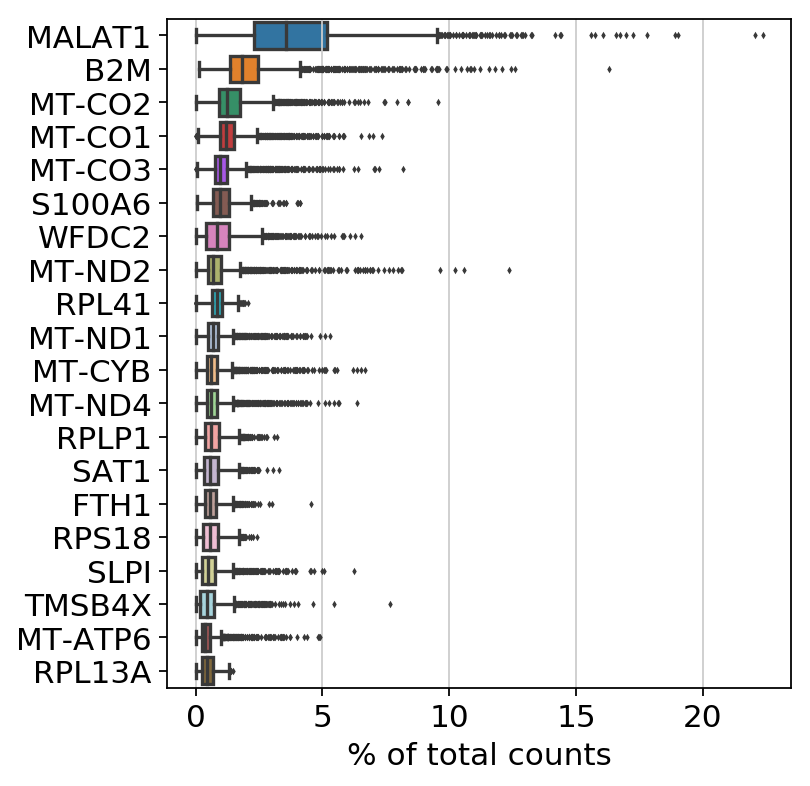

In [36]:
sc.pl.highest_expr_genes(D367_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


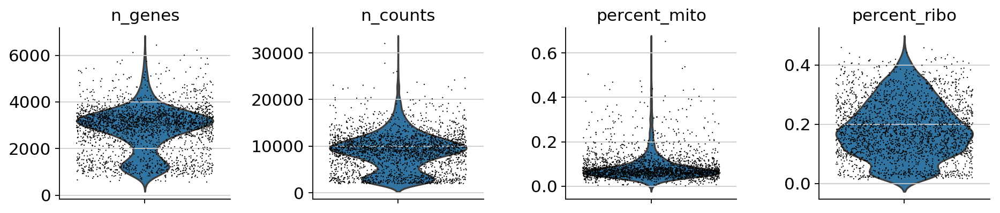

In [37]:
sc.pp.filter_cells(D367_Brus_Nas1, min_genes=0)
mito_genes = D367_Brus_Nas1.var_names.str.startswith('MT-')
D367_Brus_Nas1.obs['percent_mito'] = np.sum(
    D367_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Brus_Nas1.X, axis=1).A1
D367_Brus_Nas1.obs['n_counts'] = D367_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Brus_Nas1.to_df())
ribo_genes = D367_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D367_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D367_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Brus_Nas1.X, axis=1).A1
D367_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [38]:
sc.pp.filter_cells(D367_Brus_Nas1, min_genes=500)
D367_Brus_Nas1 = D367_Brus_Nas1[D367_Brus_Nas1.obs['n_counts'] < 30000, :]
D367_Brus_Nas1 = D367_Brus_Nas1[D367_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D367_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Brus_Nas1) # log transform the data
D367_Brus_Nas1.raw = D367_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [39]:
D367_Brus_Nas1 = D367_Brus_Nas1[:, D367_Brus_Nas1.var['ribo_genes']]
D367_Brus_Nas1

View of AnnData object with n_obs × n_vars = 2591 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [40]:
D372_Brus_Nas1 = sc.read_10x_mtx(
    './D372_Brus_Nas1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Brus_Nas1.var_names_make_unique()
D372_Brus_Nas1.obs['manip'] = 'D372_Brus_Nas1'
D372_Brus_Nas1.obs['position'] = 'Nasal'
D372_Brus_Nas1.obs['method'] = 'Brushing'
D372_Brus_Nas1.obs['donor'] = 'D372'
D372_Brus_Nas1.obs['name'] = ['D372_Brus_Nas1_' + s for s in list(D372_Brus_Nas1.obs.index)]
D372_Brus_Nas1.obs_names = D372_Brus_Nas1.obs['name']
D372_Brus_Nas1

... reading from cache file ./cache/D372_Brus_Nas1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2336 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

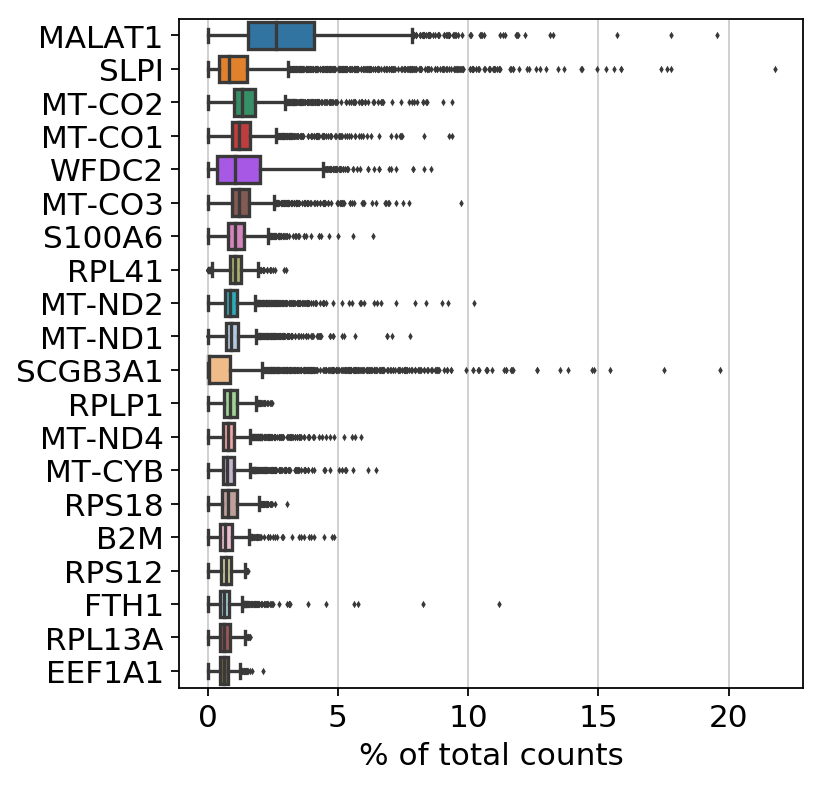

In [41]:
sc.pl.highest_expr_genes(D372_Brus_Nas1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


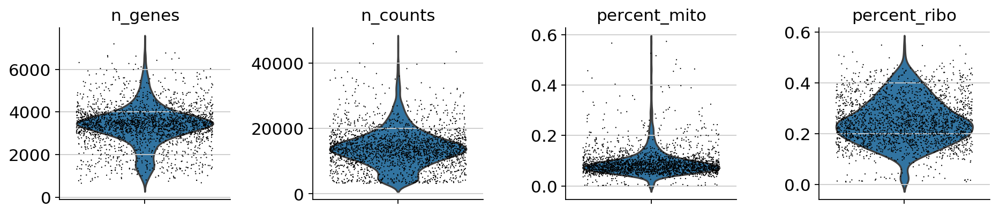

In [42]:
sc.pp.filter_cells(D372_Brus_Nas1, min_genes=0)
mito_genes = D372_Brus_Nas1.var_names.str.startswith('MT-')
D372_Brus_Nas1.obs['percent_mito'] = np.sum(
    D372_Brus_Nas1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Brus_Nas1.X, axis=1).A1
D372_Brus_Nas1.obs['n_counts'] = D372_Brus_Nas1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Brus_Nas1.to_df())
ribo_genes = D372_Brus_Nas1.to_df().columns.isin(RB_genes_in_df)
D372_Brus_Nas1.obs['percent_ribo'] = np.sum(
    D372_Brus_Nas1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Brus_Nas1.X, axis=1).A1
D372_Brus_Nas1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Brus_Nas1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [43]:
sc.pp.filter_cells(D372_Brus_Nas1, min_genes=500)
D372_Brus_Nas1 = D372_Brus_Nas1[D372_Brus_Nas1.obs['n_counts'] < 40000, :]
D372_Brus_Nas1 = D372_Brus_Nas1[D372_Brus_Nas1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D372_Brus_Nas1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Brus_Nas1) # log transform the data
D372_Brus_Nas1.raw = D372_Brus_Nas1 # freeze the object (for later use of the raw state of it)

In [44]:
D372_Brus_Nas1 = D372_Brus_Nas1[:, D372_Brus_Nas1.var['ribo_genes']]
D372_Brus_Nas1

View of AnnData object with n_obs × n_vars = 2329 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

# Proximal Biopsies
[Back to top](#Full-Aggregate)

In [45]:
D322_Biop_Pro1 = sc.read_10x_mtx(
    './D322_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Pro1.var_names_make_unique()
D322_Biop_Pro1.obs['manip'] = 'D322_Biop_Pro1'
D322_Biop_Pro1.obs['position'] = 'Proximal'
D322_Biop_Pro1.obs['method'] = 'Biopsy'
D322_Biop_Pro1.obs['donor'] = 'D322'
D322_Biop_Pro1.obs['name'] = ['D322_Biop_Pro1_' + s for s in list(D322_Biop_Pro1.obs.index)]
D322_Biop_Pro1.obs_names = D322_Biop_Pro1.obs['name']
D322_Biop_Pro1

... reading from cache file ./cache/D322_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2035 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

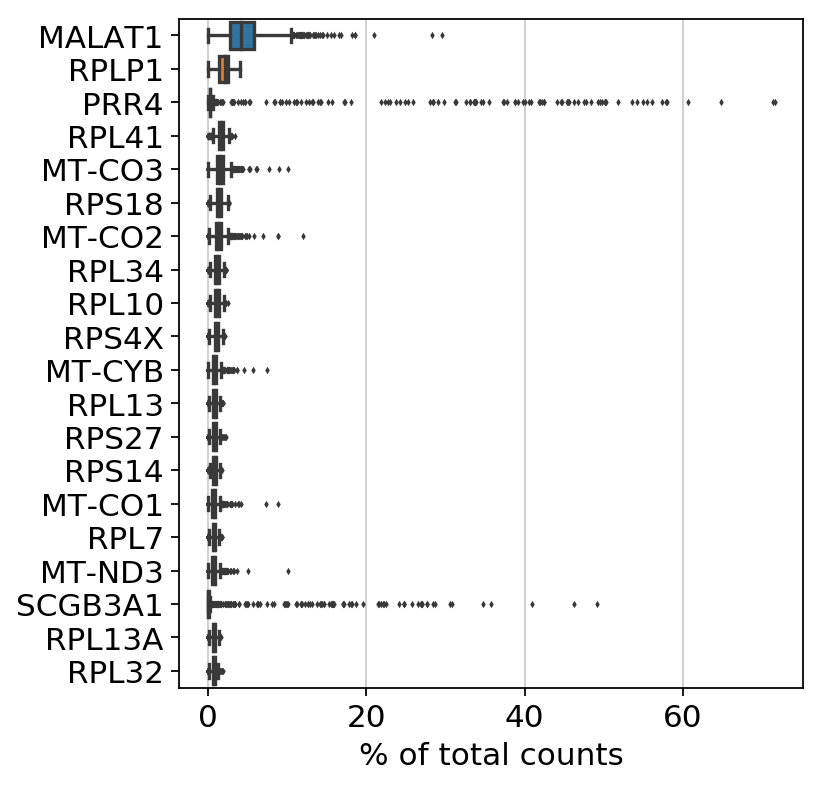

In [46]:
sc.pl.highest_expr_genes(D322_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


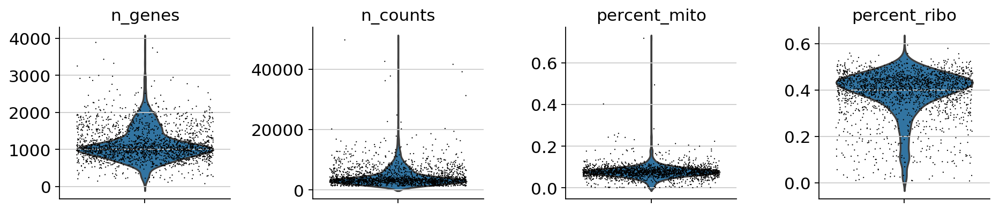

In [47]:
sc.pp.filter_cells(D322_Biop_Pro1, min_genes=0)
mito_genes = D322_Biop_Pro1.var_names.str.startswith('MT-')
D322_Biop_Pro1.obs['percent_mito'] = np.sum(
    D322_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Pro1.X, axis=1).A1
D322_Biop_Pro1.obs['n_counts'] = D322_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Pro1.to_df())
ribo_genes = D322_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D322_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Pro1.X, axis=1).A1
D322_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [48]:
sc.pp.filter_cells(D322_Biop_Pro1, min_genes=500)
D322_Biop_Pro1 = D322_Biop_Pro1[D322_Biop_Pro1.obs['n_counts'] < 20000, :]
D322_Biop_Pro1 = D322_Biop_Pro1[D322_Biop_Pro1.obs['percent_mito'] < 0.3, :]
sc.pp.normalize_per_cell(D322_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Pro1) # log transform the data
D322_Biop_Pro1.raw = D322_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 60 cells that have less than 500 genes expressed


In [49]:
D322_Biop_Pro1 = D322_Biop_Pro1[:, D322_Biop_Pro1.var['ribo_genes']]
D322_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1962 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [50]:
D326_Biop_Pro1 = sc.read_10x_mtx(
    './D326_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Biop_Pro1.var_names_make_unique()
D326_Biop_Pro1.obs['manip'] = 'D326_Biop_Pro1'
D326_Biop_Pro1.obs['position'] = 'Proximal'
D326_Biop_Pro1.obs['method'] = 'Biopsy'
D326_Biop_Pro1.obs['donor'] = 'D326'
D326_Biop_Pro1.obs['name'] = ['D326_Biop_Pro1_' + s for s in list(D326_Biop_Pro1.obs.index)]
D326_Biop_Pro1.obs_names = D326_Biop_Pro1.obs['name']
D326_Biop_Pro1

... reading from cache file ./cache/D326_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2941 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

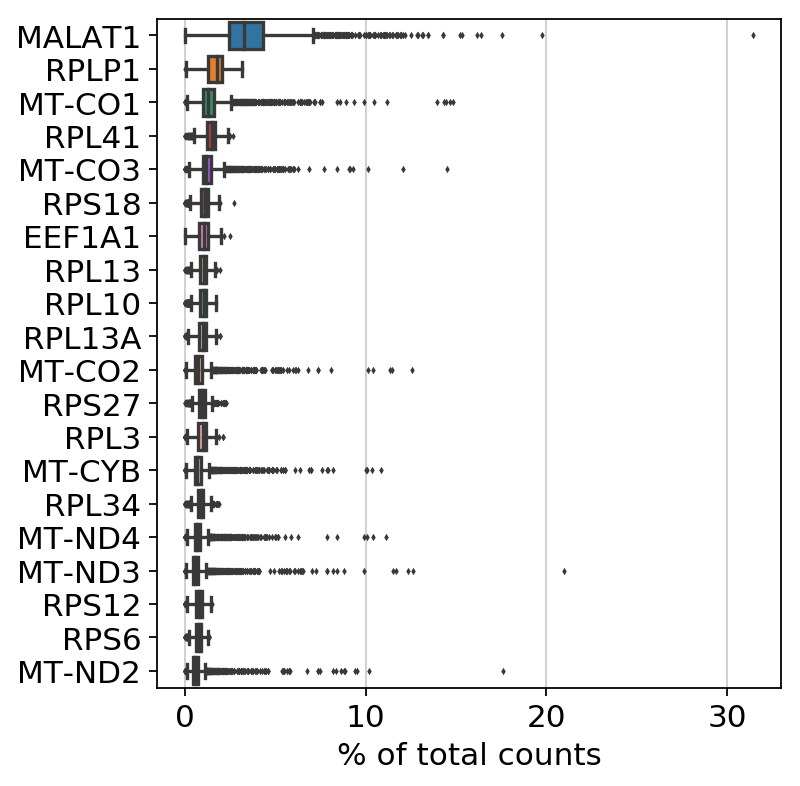

In [51]:
sc.pl.highest_expr_genes(D326_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


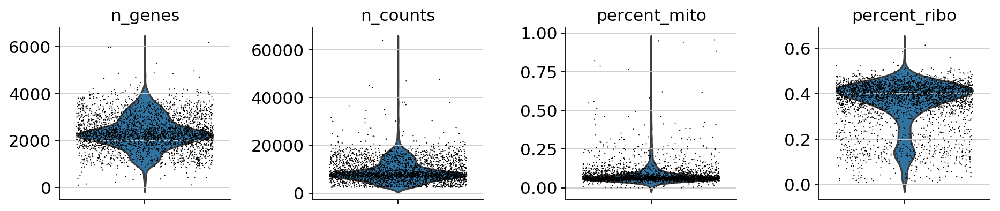

In [52]:
sc.pp.filter_cells(D326_Biop_Pro1, min_genes=0)
mito_genes = D326_Biop_Pro1.var_names.str.startswith('MT-')
D326_Biop_Pro1.obs['percent_mito'] = np.sum(
    D326_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Biop_Pro1.X, axis=1).A1
D326_Biop_Pro1.obs['n_counts'] = D326_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Biop_Pro1.to_df())
ribo_genes = D326_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D326_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D326_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Biop_Pro1.X, axis=1).A1
D326_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [53]:
sc.pp.filter_cells(D326_Biop_Pro1, min_genes=500)
D326_Biop_Pro1 = D326_Biop_Pro1[D326_Biop_Pro1.obs['n_counts'] < 40000, :]
D326_Biop_Pro1 = D326_Biop_Pro1[D326_Biop_Pro1.obs['percent_mito'] < 0.5, :]
sc.pp.normalize_per_cell(D326_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Biop_Pro1) # log transform the data
D326_Biop_Pro1.raw = D326_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 12 cells that have less than 500 genes expressed


In [54]:
D326_Biop_Pro1 = D326_Biop_Pro1[:, D326_Biop_Pro1.var['ribo_genes']]
D326_Biop_Pro1

View of AnnData object with n_obs × n_vars = 2918 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [55]:
D339_Biop_Pro1 = sc.read_10x_mtx(
    './D339_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Pro1.var_names_make_unique()
D339_Biop_Pro1.obs['manip'] = 'D339_Biop_Pro1'
D339_Biop_Pro1.obs['position'] = 'Proximal'
D339_Biop_Pro1.obs['method'] = 'Biopsy'
D339_Biop_Pro1.obs['donor'] = 'D339'
D339_Biop_Pro1.obs['name'] = ['D339_Biop_Pro1_' + s for s in list(D339_Biop_Pro1.obs.index)]
D339_Biop_Pro1.obs_names = D339_Biop_Pro1.obs['name']
D339_Biop_Pro1

... reading from cache file ./cache/D339_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 762 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

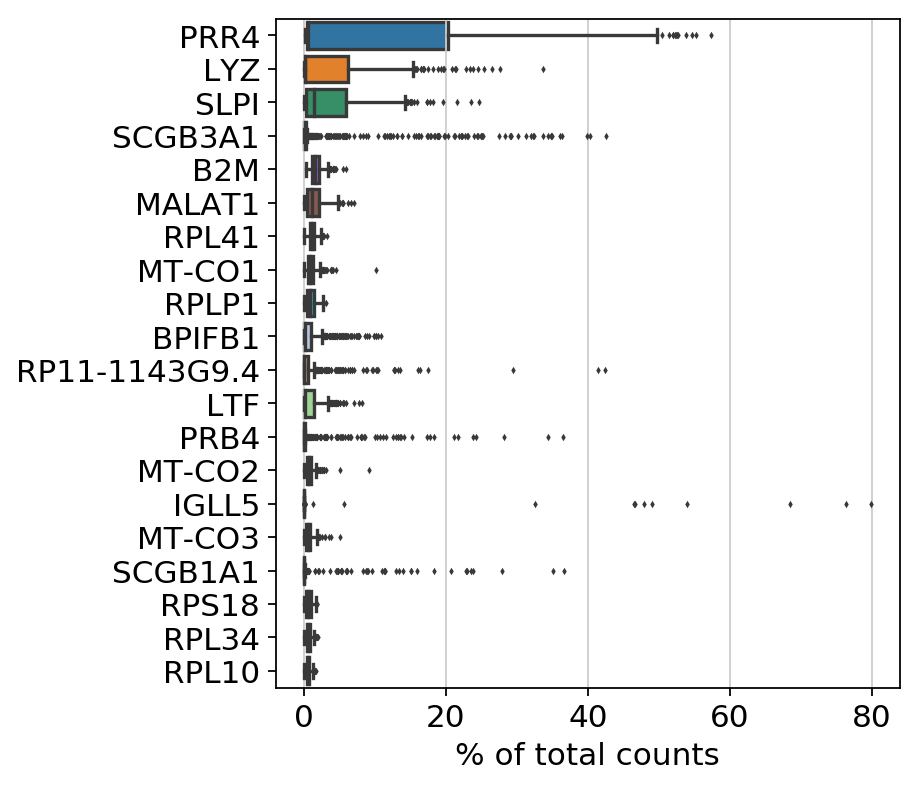

In [56]:
sc.pl.highest_expr_genes(D339_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


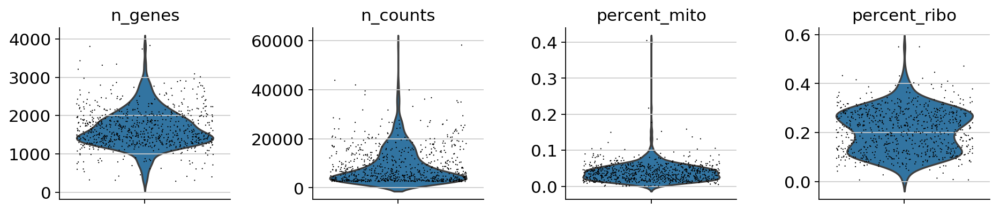

In [57]:
sc.pp.filter_cells(D339_Biop_Pro1, min_genes=0)
mito_genes = D339_Biop_Pro1.var_names.str.startswith('MT-')
D339_Biop_Pro1.obs['percent_mito'] = np.sum(
    D339_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Pro1.X, axis=1).A1
D339_Biop_Pro1.obs['n_counts'] = D339_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Pro1.to_df())
ribo_genes = D339_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D339_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Pro1.X, axis=1).A1
D339_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [58]:
sc.pp.filter_cells(D339_Biop_Pro1, min_genes=500)
D339_Biop_Pro1 = D339_Biop_Pro1[D339_Biop_Pro1.obs['n_counts'] < 40000, :]
D339_Biop_Pro1 = D339_Biop_Pro1[D339_Biop_Pro1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D339_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Pro1) # log transform the data
D339_Biop_Pro1.raw = D339_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 8 cells that have less than 500 genes expressed


In [59]:
D339_Biop_Pro1 = D339_Biop_Pro1[:, D339_Biop_Pro1.var['ribo_genes']]
D339_Biop_Pro1

View of AnnData object with n_obs × n_vars = 749 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [60]:
D344_Biop_Pro1 = sc.read_10x_mtx(
    './D344_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Pro1.var_names_make_unique()
D344_Biop_Pro1.obs['manip'] = 'D344_Biop_Pro1'
D344_Biop_Pro1.obs['position'] = 'Proximal'
D344_Biop_Pro1.obs['method'] = 'Biopsy'
D344_Biop_Pro1.obs['donor'] = 'D344'
D344_Biop_Pro1.obs['name'] = ['D344_Biop_Pro1_' + s for s in list(D344_Biop_Pro1.obs.index)]
D344_Biop_Pro1.obs_names = D344_Biop_Pro1.obs['name']
D344_Biop_Pro1

... reading from cache file ./cache/D344_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 313 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

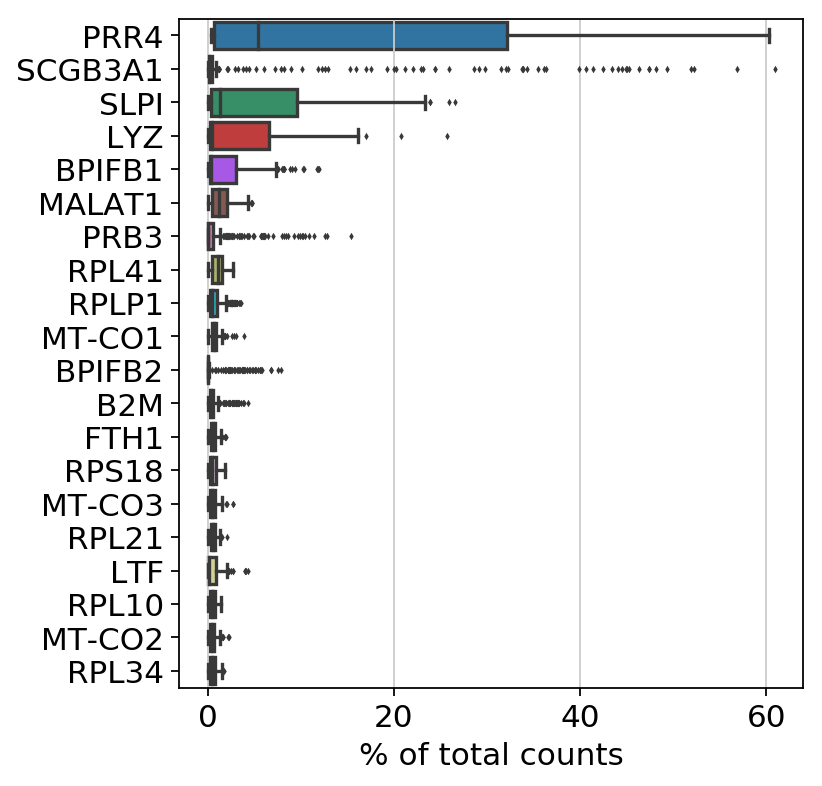

In [61]:
sc.pl.highest_expr_genes(D344_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


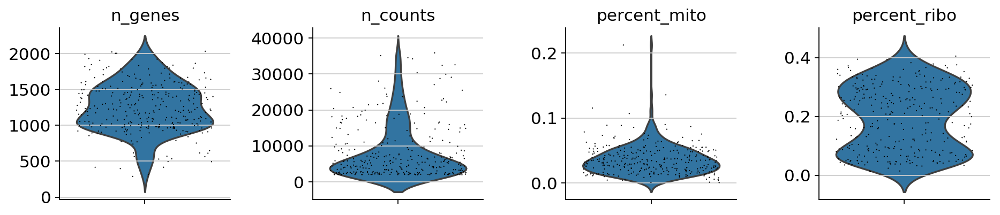

In [62]:
sc.pp.filter_cells(D344_Biop_Pro1, min_genes=0)
mito_genes = D344_Biop_Pro1.var_names.str.startswith('MT-')
D344_Biop_Pro1.obs['percent_mito'] = np.sum(
    D344_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Pro1.X, axis=1).A1
D344_Biop_Pro1.obs['n_counts'] = D344_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Pro1.to_df())
ribo_genes = D344_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D344_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Pro1.X, axis=1).A1
D344_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [63]:
sc.pp.filter_cells(D344_Biop_Pro1, min_genes=500)
D344_Biop_Pro1 = D344_Biop_Pro1[D344_Biop_Pro1.obs['n_counts'] < 40000, :]
D344_Biop_Pro1 = D344_Biop_Pro1[D344_Biop_Pro1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D344_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Pro1) # log transform the data
D344_Biop_Pro1.raw = D344_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 7 cells that have less than 500 genes expressed


In [64]:
D344_Biop_Pro1 = D344_Biop_Pro1[:, D344_Biop_Pro1.var['ribo_genes']]
D344_Biop_Pro1

View of AnnData object with n_obs × n_vars = 305 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [65]:
D353_Biop_Pro1 = sc.read_10x_mtx(
    './D353_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Biop_Pro1.var_names_make_unique()
D353_Biop_Pro1.obs['manip'] = 'D353_Biop_Pro1'
D353_Biop_Pro1.obs['position'] = 'Proximal'
D353_Biop_Pro1.obs['method'] = 'Biopsy'
D353_Biop_Pro1.obs['donor'] = 'D353'
D353_Biop_Pro1.obs['name'] = ['D353_Biop_Pro1' + s for s in list(D353_Biop_Pro1.obs.index)]
D353_Biop_Pro1.obs_names = D353_Biop_Pro1.obs['name']
D353_Biop_Pro1

... reading from cache file ./cache/D353_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4234 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

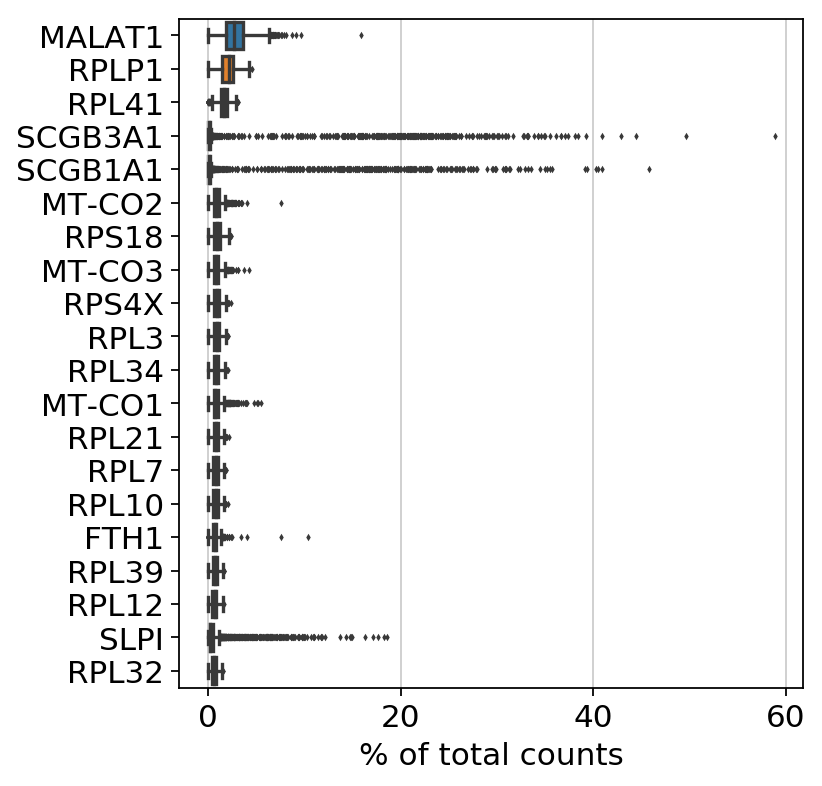

In [66]:
sc.pl.highest_expr_genes(D353_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


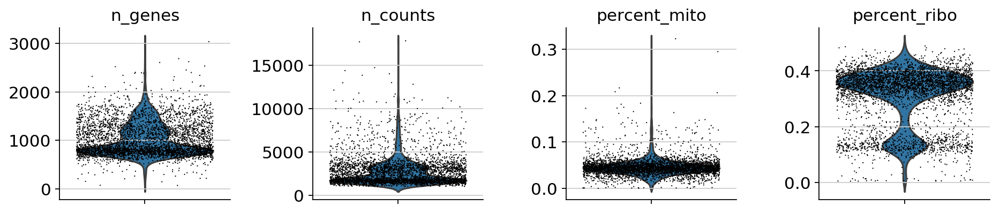

In [67]:
sc.pp.filter_cells(D353_Biop_Pro1, min_genes=0)
mito_genes = D353_Biop_Pro1.var_names.str.startswith('MT-')
D353_Biop_Pro1.obs['percent_mito'] = np.sum(
    D353_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Biop_Pro1.X, axis=1).A1
D353_Biop_Pro1.obs['n_counts'] = D353_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Biop_Pro1.to_df())
ribo_genes = D353_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D353_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D353_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Biop_Pro1.X, axis=1).A1
D353_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [68]:
sc.pp.filter_cells(D353_Biop_Pro1, min_genes=500)
D353_Biop_Pro1 = D353_Biop_Pro1[D353_Biop_Pro1.obs['n_counts'] < 15000, :]
D353_Biop_Pro1 = D353_Biop_Pro1[D353_Biop_Pro1.obs['percent_mito'] < 0.25, :]
sc.pp.normalize_per_cell(D353_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Biop_Pro1) # log transform the data
D353_Biop_Pro1.raw = D353_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 41 cells that have less than 500 genes expressed


In [69]:
D353_Biop_Pro1 = D353_Biop_Pro1[:, D353_Biop_Pro1.var['ribo_genes']]
D353_Biop_Pro1

View of AnnData object with n_obs × n_vars = 4190 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [70]:
D354_Biop_Pro1 = sc.read_10x_mtx(
    './D354_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Biop_Pro1.var_names_make_unique()
D354_Biop_Pro1.obs['manip'] = 'D354_Biop_Pro1'
D354_Biop_Pro1.obs['position'] = 'Proximal'
D354_Biop_Pro1.obs['method'] = 'Biopsy'
D354_Biop_Pro1.obs['donor'] = 'D354'
D354_Biop_Pro1.obs['name'] = ['D354_Biop_Pro1_' + s for s in list(D354_Biop_Pro1.obs.index)]
D354_Biop_Pro1.obs_names = D354_Biop_Pro1.obs['name']
D354_Biop_Pro1

... reading from cache file ./cache/D354_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1877 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

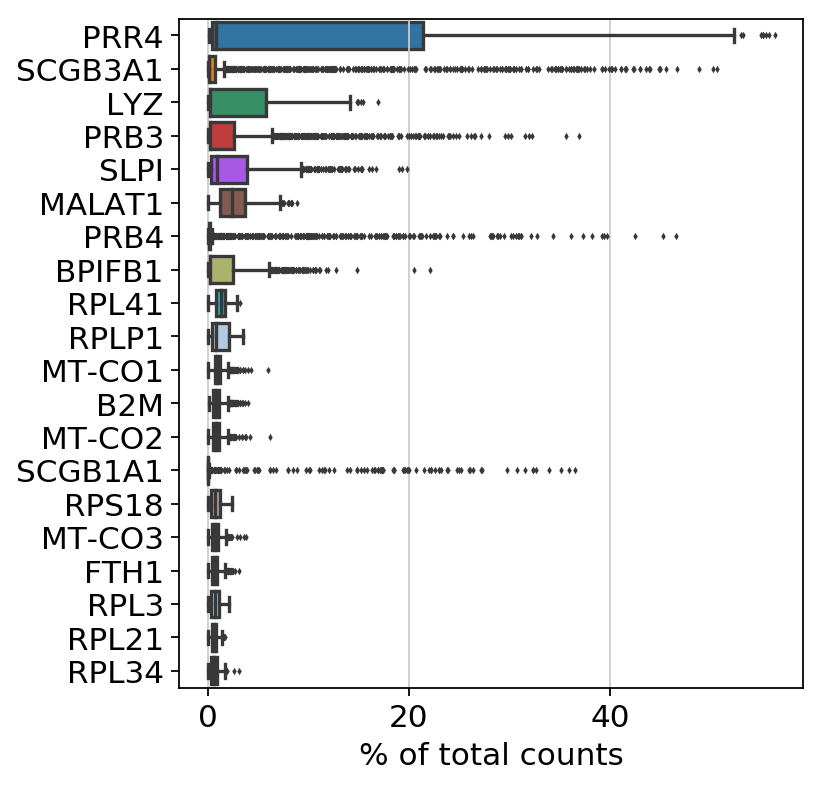

In [71]:
sc.pl.highest_expr_genes(D354_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


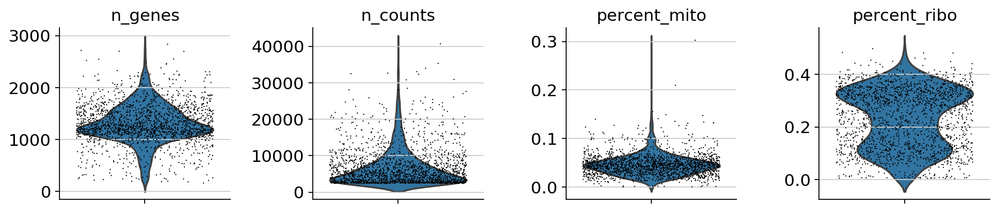

In [72]:
sc.pp.filter_cells(D354_Biop_Pro1, min_genes=0)
mito_genes = D354_Biop_Pro1.var_names.str.startswith('MT-')
D354_Biop_Pro1.obs['percent_mito'] = np.sum(
    D354_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D354_Biop_Pro1.X, axis=1).A1
D354_Biop_Pro1.obs['n_counts'] = D354_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Biop_Pro1.to_df())
ribo_genes = D354_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D354_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D354_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Biop_Pro1.X, axis=1).A1
D354_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [73]:
sc.pp.filter_cells(D354_Biop_Pro1, min_genes=500)
D354_Biop_Pro1 = D354_Biop_Pro1[D354_Biop_Pro1.obs['n_counts'] < 30000, :]
D354_Biop_Pro1 = D354_Biop_Pro1[D354_Biop_Pro1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D354_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Biop_Pro1) # log transform the data
D354_Biop_Pro1.raw = D354_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 57 cells that have less than 500 genes expressed


In [74]:
D354_Biop_Pro1 = D354_Biop_Pro1[:, D354_Biop_Pro1.var['ribo_genes']]
D354_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1809 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [75]:
D363_Biop_Pro1 = sc.read_10x_mtx(
    './D363_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Biop_Pro1.var_names_make_unique()
D363_Biop_Pro1.obs['manip'] = 'D363_Biop_Pro1'
D363_Biop_Pro1.obs['position'] = 'Proximal'
D363_Biop_Pro1.obs['method'] = 'Biopsy'
D363_Biop_Pro1.obs['donor'] = 'D363'
D363_Biop_Pro1.obs['name'] = ['D363_Biop_Pro1_' + s for s in list(D363_Biop_Pro1.obs.index)]
D363_Biop_Pro1.obs_names = D363_Biop_Pro1.obs['name']
D363_Biop_Pro1

... reading from cache file ./cache/D363_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1531 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

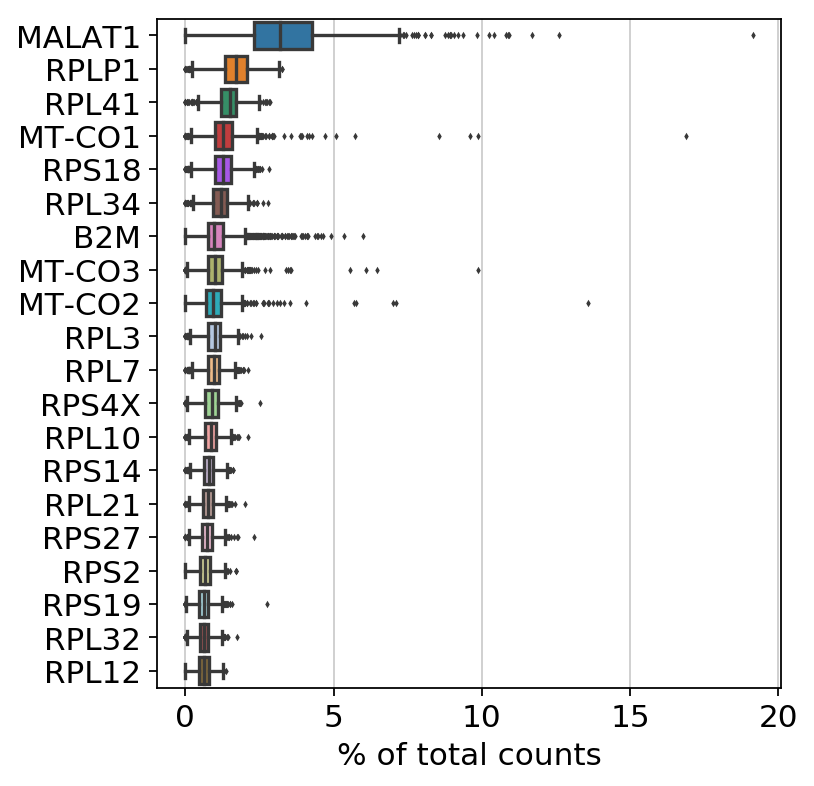

In [76]:
sc.pl.highest_expr_genes(D363_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


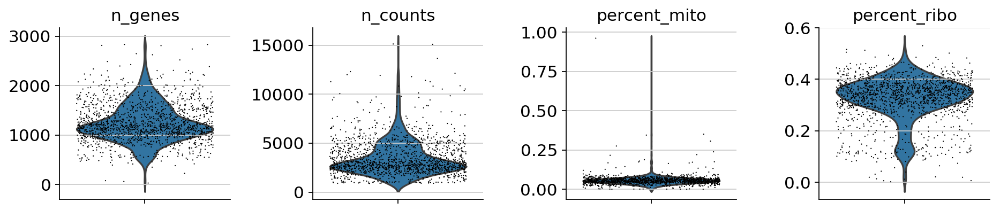

In [77]:
sc.pp.filter_cells(D363_Biop_Pro1, min_genes=0)
mito_genes = D363_Biop_Pro1.var_names.str.startswith('MT-')
D363_Biop_Pro1.obs['percent_mito'] = np.sum(
    D363_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Biop_Pro1.X, axis=1).A1
D363_Biop_Pro1.obs['n_counts'] = D363_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Biop_Pro1.to_df())
ribo_genes = D363_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D363_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D363_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Biop_Pro1.X, axis=1).A1
D363_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [78]:
sc.pp.filter_cells(D363_Biop_Pro1, min_genes=500)
D363_Biop_Pro1 = D363_Biop_Pro1[D363_Biop_Pro1.obs['n_counts'] < 15000, :]
D363_Biop_Pro1 = D363_Biop_Pro1[D363_Biop_Pro1.obs['percent_mito'] < 0.25, :]
sc.pp.normalize_per_cell(D363_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Biop_Pro1) # log transform the data
D363_Biop_Pro1.raw = D363_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 20 cells that have less than 500 genes expressed


In [79]:
D363_Biop_Pro1 = D363_Biop_Pro1[:, D363_Biop_Pro1.var['ribo_genes']]
D363_Biop_Pro1

View of AnnData object with n_obs × n_vars = 1508 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [80]:
D367_Biop_Pro1 = sc.read_10x_mtx(
    './D367_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Biop_Pro1.var_names_make_unique()
D367_Biop_Pro1.obs['manip'] = 'D367_Biop_Pro1'
D367_Biop_Pro1.obs['position'] = 'Proximal'
D367_Biop_Pro1.obs['method'] = 'Biopsy'
D367_Biop_Pro1.obs['donor'] = 'D367'
D367_Biop_Pro1.obs['name'] = ['D367_Biop_Pro1_' + s for s in list(D367_Biop_Pro1.obs.index)]
D367_Biop_Pro1.obs_names = D367_Biop_Pro1.obs['name']
D367_Biop_Pro1

... reading from cache file ./cache/D367_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3180 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

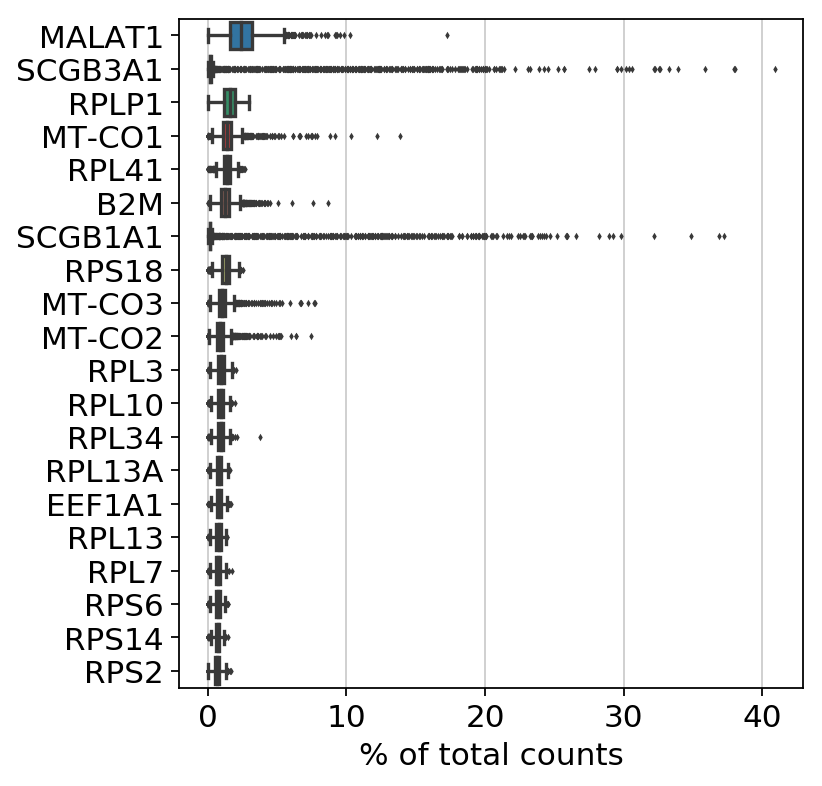

In [81]:
sc.pl.highest_expr_genes(D367_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


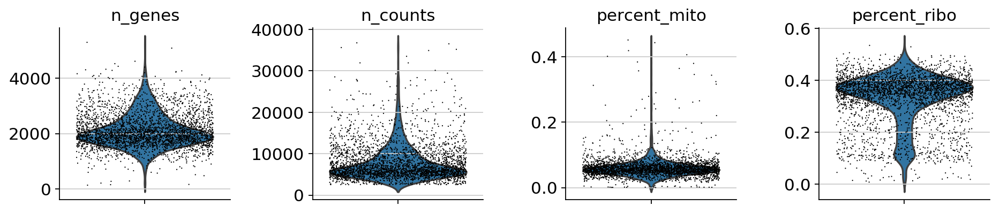

In [82]:
sc.pp.filter_cells(D367_Biop_Pro1, min_genes=0)
mito_genes = D367_Biop_Pro1.var_names.str.startswith('MT-')
D367_Biop_Pro1.obs['percent_mito'] = np.sum(
    D367_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Biop_Pro1.X, axis=1).A1
D367_Biop_Pro1.obs['n_counts'] = D367_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Biop_Pro1.to_df())
ribo_genes = D367_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D367_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D367_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Biop_Pro1.X, axis=1).A1
D367_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [83]:
sc.pp.filter_cells(D367_Biop_Pro1, min_genes=500)
D367_Biop_Pro1 = D367_Biop_Pro1[D367_Biop_Pro1.obs['n_counts'] < 30000, :]
D367_Biop_Pro1 = D367_Biop_Pro1[D367_Biop_Pro1.obs['percent_mito'] < 0.4, :]
sc.pp.normalize_per_cell(D367_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Biop_Pro1) # log transform the data
D367_Biop_Pro1.raw = D367_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 7 cells that have less than 500 genes expressed


In [84]:
D367_Biop_Pro1 = D367_Biop_Pro1[:, D367_Biop_Pro1.var['ribo_genes']]
D367_Biop_Pro1

View of AnnData object with n_obs × n_vars = 3159 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [85]:
D372_Biop_Pro1 = sc.read_10x_mtx(
    './D372_Biop_Pro1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Pro1.var_names_make_unique()
D372_Biop_Pro1.obs['manip'] = 'D372_Biop_Pro1'
D372_Biop_Pro1.obs['position'] = 'Proximal'
D372_Biop_Pro1.obs['method'] = 'Biopsy'
D372_Biop_Pro1.obs['donor'] = 'D372'
D372_Biop_Pro1.obs['name'] = ['D372_Biop_Pro1_' + s for s in list(D372_Biop_Pro1.obs.index)]
D372_Biop_Pro1.obs_names = D372_Biop_Pro1.obs['name']
D372_Biop_Pro1

... reading from cache file ./cache/D372_Biop_Pro1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4585 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

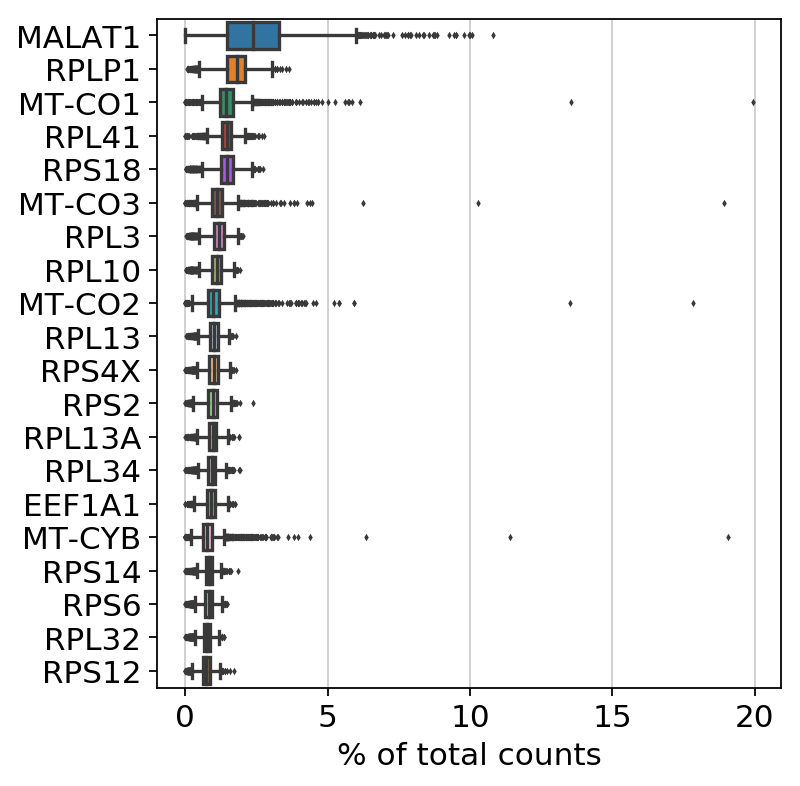

In [86]:
sc.pl.highest_expr_genes(D372_Biop_Pro1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


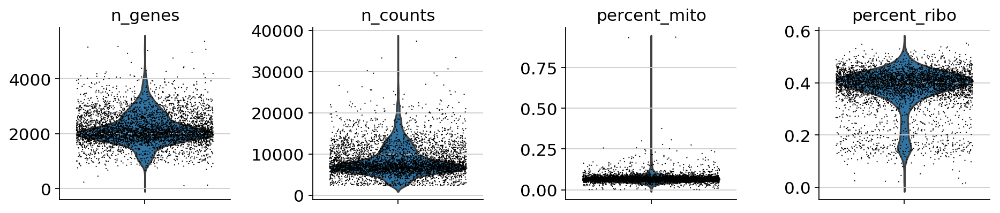

In [87]:
sc.pp.filter_cells(D372_Biop_Pro1, min_genes=0)
mito_genes = D372_Biop_Pro1.var_names.str.startswith('MT-')
D372_Biop_Pro1.obs['percent_mito'] = np.sum(
    D372_Biop_Pro1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Pro1.X, axis=1).A1
D372_Biop_Pro1.obs['n_counts'] = D372_Biop_Pro1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Pro1.to_df())
ribo_genes = D372_Biop_Pro1.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Pro1.obs['percent_ribo'] = np.sum(
    D372_Biop_Pro1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Pro1.X, axis=1).A1
D372_Biop_Pro1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Pro1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [88]:
sc.pp.filter_cells(D372_Biop_Pro1, min_genes=500)
D372_Biop_Pro1 = D372_Biop_Pro1[D372_Biop_Pro1.obs['n_counts'] < 30000, :]
D372_Biop_Pro1 = D372_Biop_Pro1[D372_Biop_Pro1.obs['percent_mito'] < 0.3, :]
sc.pp.normalize_per_cell(D372_Biop_Pro1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Pro1) # log transform the data
D372_Biop_Pro1.raw = D372_Biop_Pro1 # freeze the object (for later use of the raw state of it)

filtered out 4 cells that have less than 500 genes expressed


In [89]:
D372_Biop_Pro1 = D372_Biop_Pro1[:, D372_Biop_Pro1.var['ribo_genes']]
D372_Biop_Pro1

View of AnnData object with n_obs × n_vars = 4574 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

# Intermediate Biopsies
[Back to top](#Full-Aggregate)

In [90]:
D322_Biop_Int1 = sc.read_10x_mtx(
    './D322_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D322_Biop_Int1.var_names_make_unique()
D322_Biop_Int1.obs['manip'] = 'D322_Biop_Int1'
D322_Biop_Int1.obs['position'] = 'Intermediate'
D322_Biop_Int1.obs['method'] = 'Biopsy'
D322_Biop_Int1.obs['donor'] = 'D322'
D322_Biop_Int1.obs['name'] = ['D322_Biop_Int1_' + s for s in list(D322_Biop_Int1.obs.index)]
D322_Biop_Int1.obs_names = D322_Biop_Int1.obs['name']
D322_Biop_Int1

... reading from cache file ./cache/D322_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1923 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

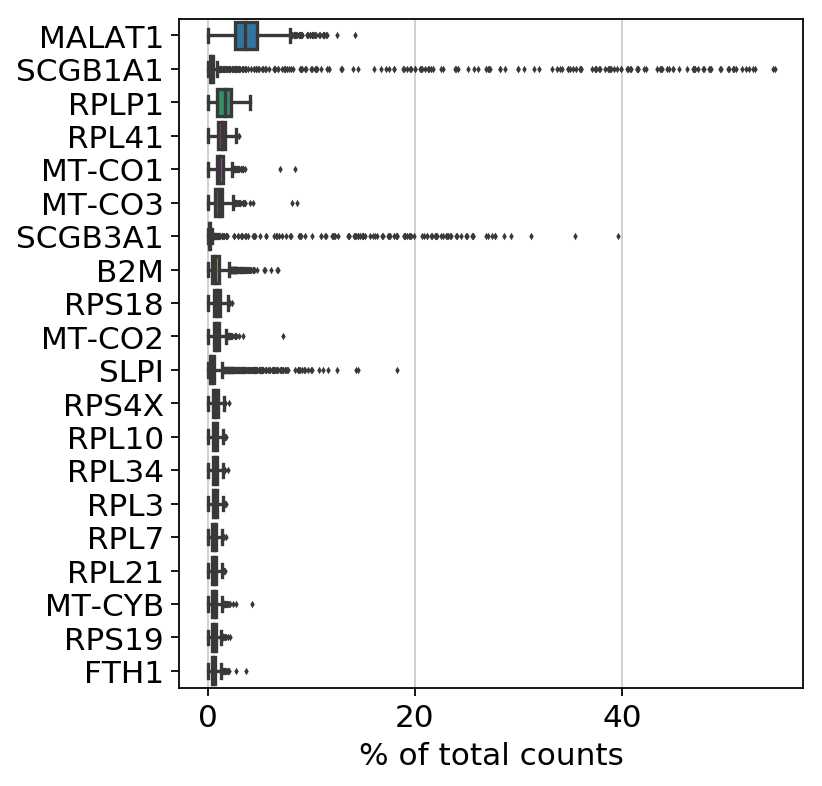

In [91]:
sc.pl.highest_expr_genes(D322_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


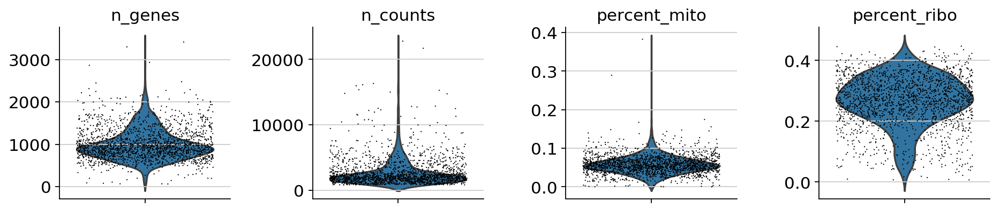

In [92]:
sc.pp.filter_cells(D322_Biop_Int1, min_genes=0)
mito_genes = D322_Biop_Int1.var_names.str.startswith('MT-')
D322_Biop_Int1.obs['percent_mito'] = np.sum(
    D322_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D322_Biop_Int1.X, axis=1).A1
D322_Biop_Int1.obs['n_counts'] = D322_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D322_Biop_Int1.to_df())
ribo_genes = D322_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D322_Biop_Int1.obs['percent_ribo'] = np.sum(
    D322_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D322_Biop_Int1.X, axis=1).A1
D322_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D322_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [93]:
sc.pp.filter_cells(D322_Biop_Int1, min_genes=500)
D322_Biop_Int1 = D322_Biop_Int1[D322_Biop_Int1.obs['n_counts'] < 20000, :]
D322_Biop_Int1 = D322_Biop_Int1[D322_Biop_Int1.obs['percent_mito'] < 0.2 , :]
sc.pp.normalize_per_cell(D322_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D322_Biop_Int1) # log transform the data
D322_Biop_Int1.raw = D322_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 64 cells that have less than 500 genes expressed


In [94]:
D322_Biop_Int1 = D322_Biop_Int1[:, D322_Biop_Int1.var['ribo_genes']]
D322_Biop_Int1

View of AnnData object with n_obs × n_vars = 1857 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [95]:
D326_Biop_Int1 = sc.read_10x_mtx(
    './D326_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Biop_Int1.var_names_make_unique()
D326_Biop_Int1.obs['manip'] = 'D326_Biop_Int1'
D326_Biop_Int1.obs['position'] = 'Intermediate'
D326_Biop_Int1.obs['method'] = 'Biopsy'
D326_Biop_Int1.obs['donor'] = 'D326'
D326_Biop_Int1.obs['name'] = ['D326_Biop_Int1_' + s for s in list(D326_Biop_Int1.obs.index)]
D326_Biop_Int1.obs_names = D326_Biop_Int1.obs['name']
D326_Biop_Int1

... reading from cache file ./cache/D326_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1248 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

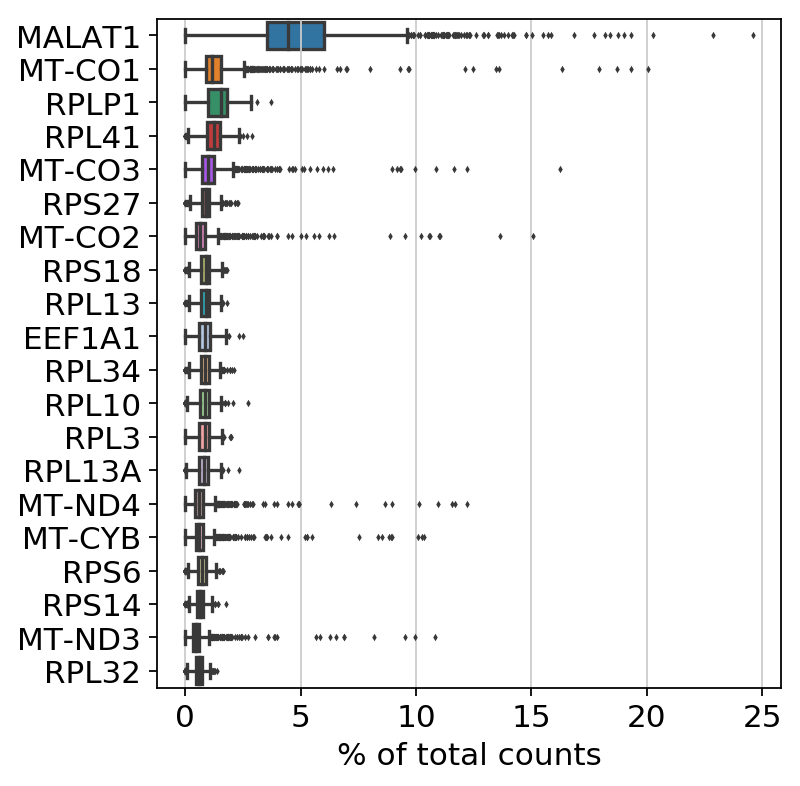

In [96]:
sc.pl.highest_expr_genes(D326_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


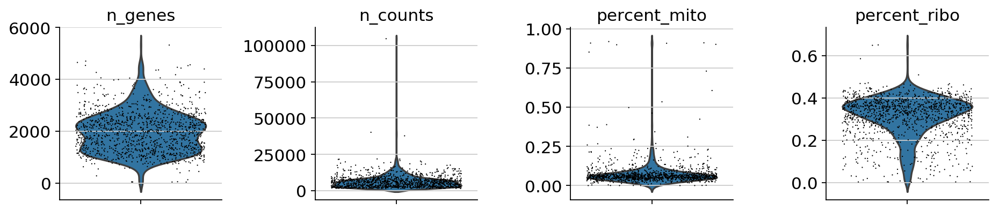

In [97]:
sc.pp.filter_cells(D326_Biop_Int1, min_genes=0)
mito_genes = D326_Biop_Int1.var_names.str.startswith('MT-')
D326_Biop_Int1.obs['percent_mito'] = np.sum(
    D326_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Biop_Int1.X, axis=1).A1
D326_Biop_Int1.obs['n_counts'] = D326_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Biop_Int1.to_df())
ribo_genes = D326_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D326_Biop_Int1.obs['percent_ribo'] = np.sum(
    D326_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Biop_Int1.X, axis=1).A1
D326_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [98]:
sc.pp.filter_cells(D326_Biop_Int1, min_genes=500)
D326_Biop_Int1 = D326_Biop_Int1[D326_Biop_Int1.obs['n_counts'] < 25000, :]
D326_Biop_Int1 = D326_Biop_Int1[D326_Biop_Int1.obs['percent_mito'] < 0.3, :]
sc.pp.normalize_per_cell(D326_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Biop_Int1) # log transform the data
D326_Biop_Int1.raw = D326_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 11 cells that have less than 500 genes expressed


In [99]:
D326_Biop_Int1 = D326_Biop_Int1[:, D326_Biop_Int1.var['ribo_genes']]
D326_Biop_Int1

View of AnnData object with n_obs × n_vars = 1226 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [100]:
D339_Biop_Int1 = sc.read_10x_mtx(
    './D339_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Biop_Int1.var_names_make_unique()
D339_Biop_Int1.obs['manip'] = 'D339_Biop_Int1'
D339_Biop_Int1.obs['position'] = 'Intermediate'
D339_Biop_Int1.obs['method'] = 'Biopsy'
D339_Biop_Int1.obs['donor'] = 'D339'
D339_Biop_Int1.obs['name'] = ['D339_Biop_Int1_' + s for s in list(D339_Biop_Int1.obs.index)]
D339_Biop_Int1.obs_names = D339_Biop_Int1.obs['name']
D339_Biop_Int1

... reading from cache file ./cache/D339_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 3348 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

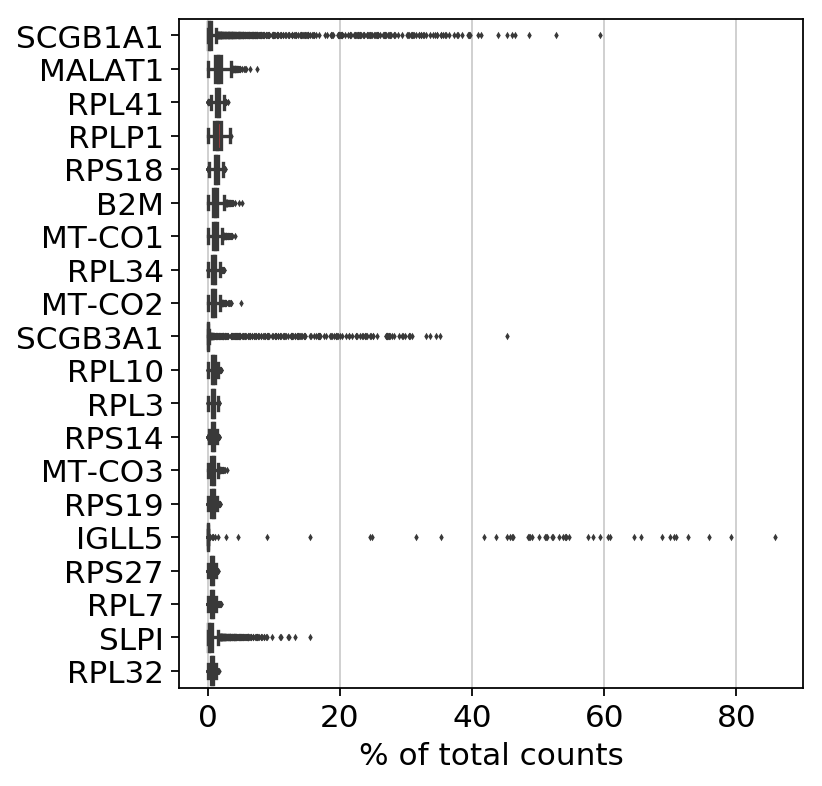

In [101]:
sc.pl.highest_expr_genes(D339_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


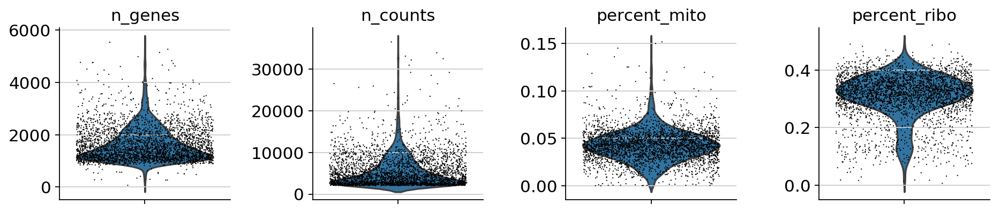

In [102]:
sc.pp.filter_cells(D339_Biop_Int1, min_genes=0)
mito_genes = D339_Biop_Int1.var_names.str.startswith('MT-')
D339_Biop_Int1.obs['percent_mito'] = np.sum(
    D339_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Biop_Int1.X, axis=1).A1
D339_Biop_Int1.obs['n_counts'] = D339_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Biop_Int1.to_df())
ribo_genes = D339_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D339_Biop_Int1.obs['percent_ribo'] = np.sum(
    D339_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Biop_Int1.X, axis=1).A1
D339_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [103]:
sc.pp.filter_cells(D339_Biop_Int1, min_genes=500)
D339_Biop_Int1 = D339_Biop_Int1[D339_Biop_Int1.obs['n_counts'] < 30000, :]
D339_Biop_Int1 = D339_Biop_Int1[D339_Biop_Int1.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D339_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Biop_Int1) # log transform the data
D339_Biop_Int1.raw = D339_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 9 cells that have less than 500 genes expressed


In [104]:
D339_Biop_Int1 = D339_Biop_Int1[:, D339_Biop_Int1.var['ribo_genes']]
D339_Biop_Int1

View of AnnData object with n_obs × n_vars = 3330 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [105]:
D344_Biop_Int1 = sc.read_10x_mtx(
    './D344_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Biop_Int1.var_names_make_unique()
D344_Biop_Int1.obs['manip'] = 'D344_Biop_Int1'
D344_Biop_Int1.obs['position'] = 'Intermediate'
D344_Biop_Int1.obs['method'] = 'Biopsy'
D344_Biop_Int1.obs['donor'] = 'D344'
D344_Biop_Int1.obs['name'] = ['D344_Biop_Int1_' + s for s in list(D344_Biop_Int1.obs.index)]
D344_Biop_Int1.obs_names = D344_Biop_Int1.obs['name']
D344_Biop_Int1

... reading from cache file ./cache/D344_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1051 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

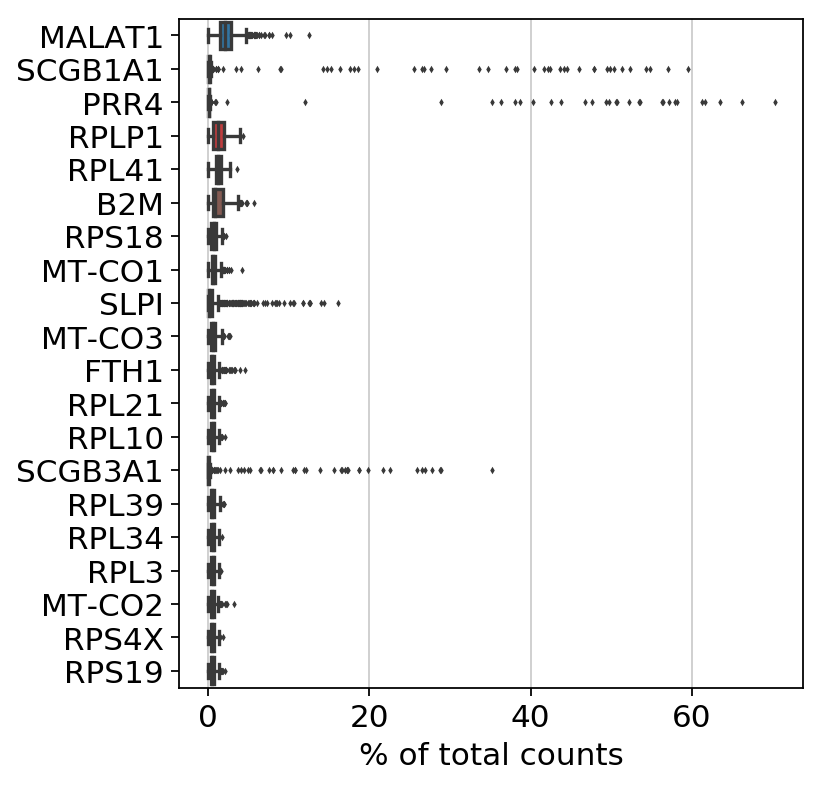

In [106]:
sc.pl.highest_expr_genes(D344_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


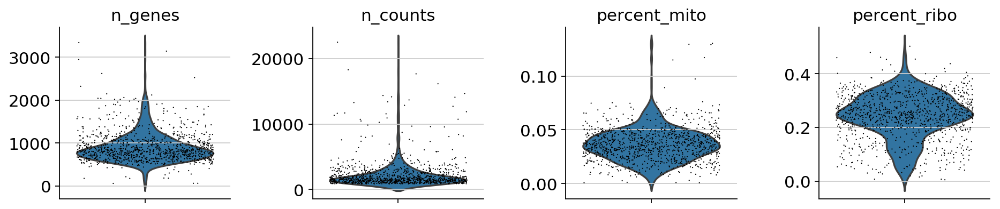

In [107]:
sc.pp.filter_cells(D344_Biop_Int1, min_genes=0)
mito_genes = D344_Biop_Int1.var_names.str.startswith('MT-')
D344_Biop_Int1.obs['percent_mito'] = np.sum(
    D344_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Biop_Int1.X, axis=1).A1
D344_Biop_Int1.obs['n_counts'] = D344_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Biop_Int1.to_df())
ribo_genes = D344_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D344_Biop_Int1.obs['percent_ribo'] = np.sum(
    D344_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Biop_Int1.X, axis=1).A1
D344_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [108]:
sc.pp.filter_cells(D344_Biop_Int1, min_genes=500)
D344_Biop_Int1 = D344_Biop_Int1[D344_Biop_Int1.obs['n_counts'] < 10000, :]
D344_Biop_Int1 = D344_Biop_Int1[D344_Biop_Int1.obs['percent_mito'] < 0.1, :]
sc.pp.normalize_per_cell(D344_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Biop_Int1) # log transform the data
D344_Biop_Int1.raw = D344_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 27 cells that have less than 500 genes expressed


In [109]:
D344_Biop_Int1 = D344_Biop_Int1[:, D344_Biop_Int1.var['ribo_genes']]
D344_Biop_Int1

View of AnnData object with n_obs × n_vars = 1000 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [110]:
D353_Biop_Int2 = sc.read_10x_mtx(
    './D353_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Biop_Int2.var_names_make_unique()
D353_Biop_Int2.obs['manip'] = 'D353_Biop_Int2'
D353_Biop_Int2.obs['position'] = 'Intermediate'
D353_Biop_Int2.obs['method'] = 'Biopsy'
D353_Biop_Int2.obs['donor'] = 'D353'
D353_Biop_Int2.obs['name'] = ['D353_Biop_Int2_' + s for s in list(D353_Biop_Int2.obs.index)]
D353_Biop_Int2.obs_names = D353_Biop_Int2.obs['name']
D353_Biop_Int2

... reading from cache file ./cache/D353_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2291 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

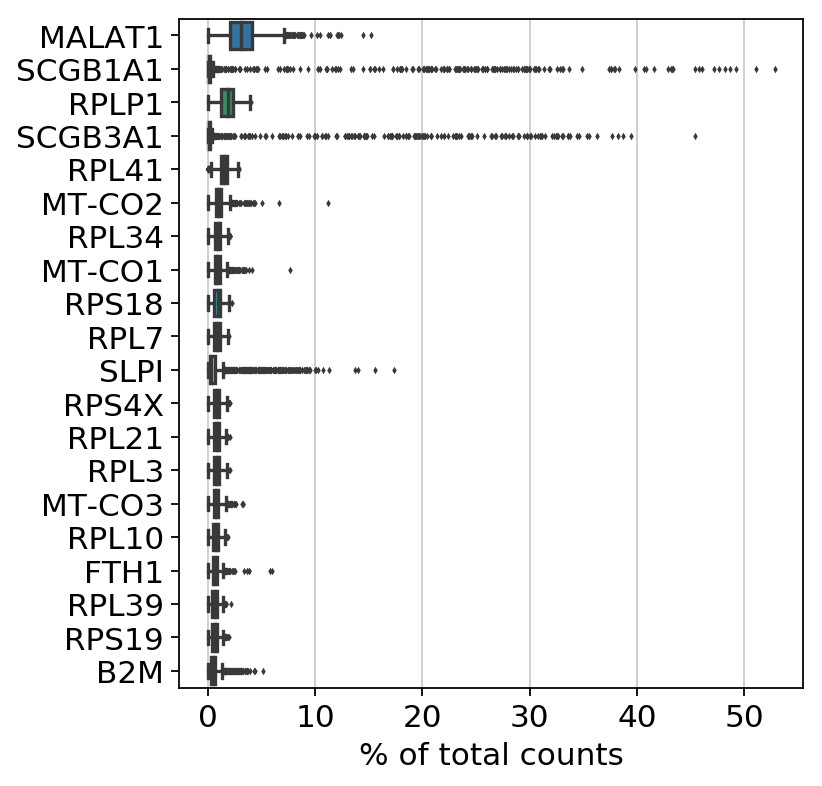

In [111]:
sc.pl.highest_expr_genes(D353_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


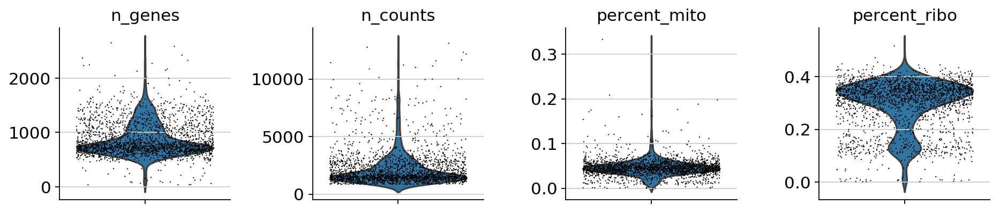

In [112]:
sc.pp.filter_cells(D353_Biop_Int2, min_genes=0)
mito_genes = D353_Biop_Int2.var_names.str.startswith('MT-')
D353_Biop_Int2.obs['percent_mito'] = np.sum(
    D353_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D353_Biop_Int2.X, axis=1).A1
D353_Biop_Int2.obs['n_counts'] = D353_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Biop_Int2.to_df())
ribo_genes = D353_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D353_Biop_Int2.obs['percent_ribo'] = np.sum(
    D353_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Biop_Int2.X, axis=1).A1
D353_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [113]:
sc.pp.filter_cells(D353_Biop_Int2, min_genes=500)
D353_Biop_Int2 = D353_Biop_Int2[D353_Biop_Int2.obs['n_counts'] < 10000, :]
D353_Biop_Int2 = D353_Biop_Int2[D353_Biop_Int2.obs['percent_mito'] < 0.15, :]
sc.pp.normalize_per_cell(D353_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Biop_Int2) # log transform the data
D353_Biop_Int2.raw = D353_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 72 cells that have less than 500 genes expressed


In [114]:
D353_Biop_Int2 = D353_Biop_Int2[:, D353_Biop_Int2.var['ribo_genes']]
D353_Biop_Int2

View of AnnData object with n_obs × n_vars = 2196 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [115]:
D354_Biop_Int2 = sc.read_10x_mtx(
    './D354_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Biop_Int2.var_names_make_unique()
D354_Biop_Int2.obs['manip'] = 'D354_Biop_Int2'
D354_Biop_Int2.obs['position'] = 'Intermediate'
D354_Biop_Int2.obs['method'] = 'Biopsy'
D354_Biop_Int2.obs['donor'] = 'D354'
D354_Biop_Int2.obs['name'] = ['D354_Biop_Int2_' + s for s in list(D354_Biop_Int2.obs.index)]
D354_Biop_Int2.obs_names = D354_Biop_Int2.obs['name']
D354_Biop_Int2

... reading from cache file ./cache/D354_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2775 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

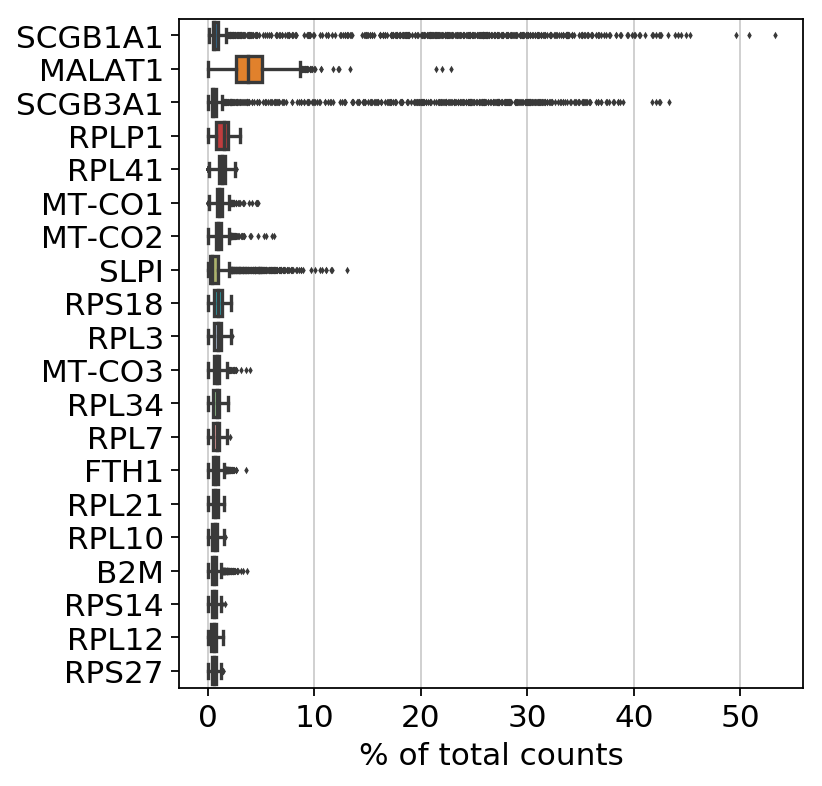

In [116]:
sc.pl.highest_expr_genes(D354_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


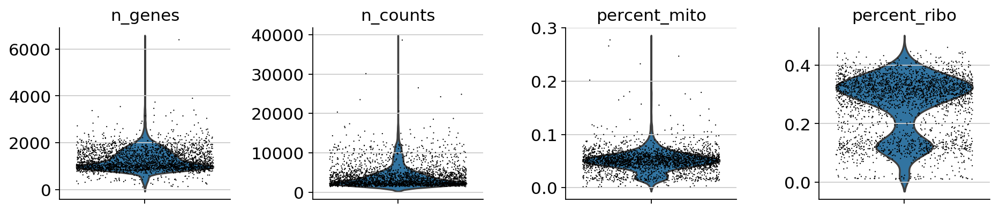

In [117]:
sc.pp.filter_cells(D354_Biop_Int2, min_genes=0)
mito_genes = D354_Biop_Int2.var_names.str.startswith('MT-')
D354_Biop_Int2.obs['percent_mito'] = np.sum(
    D354_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D354_Biop_Int2.X, axis=1).A1
D354_Biop_Int2.obs['n_counts'] = D354_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Biop_Int2.to_df())
ribo_genes = D354_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D354_Biop_Int2.obs['percent_ribo'] = np.sum(
    D354_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Biop_Int2.X, axis=1).A1
D354_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [118]:
sc.pp.filter_cells(D354_Biop_Int2, min_genes=500)
D354_Biop_Int2 = D354_Biop_Int2[D354_Biop_Int2.obs['n_counts'] < 20000, :]
D354_Biop_Int2 = D354_Biop_Int2[D354_Biop_Int2.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D354_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Biop_Int2) # log transform the data
D354_Biop_Int2.raw = D354_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 51 cells that have less than 500 genes expressed


In [119]:
D354_Biop_Int2 = D354_Biop_Int2[:, D354_Biop_Int2.var['ribo_genes']]
D354_Biop_Int2

View of AnnData object with n_obs × n_vars = 2711 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [120]:
D363_Biop_Int2 = sc.read_10x_mtx(
    './D363_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Biop_Int2.var_names_make_unique()
D363_Biop_Int2.obs['manip'] = 'D363_Biop_Int2'
D363_Biop_Int2.obs['position'] = 'Intermediate'
D363_Biop_Int2.obs['method'] = 'Biopsy'
D363_Biop_Int2.obs['donor'] = 'D363'
D363_Biop_Int2.obs['name'] = ['D363_Biop_Int2_' + s for s in list(D363_Biop_Int2.obs.index)]
D363_Biop_Int2.obs_names = D363_Biop_Int2.obs['name']
D363_Biop_Int2

... reading from cache file ./cache/D363_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1290 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

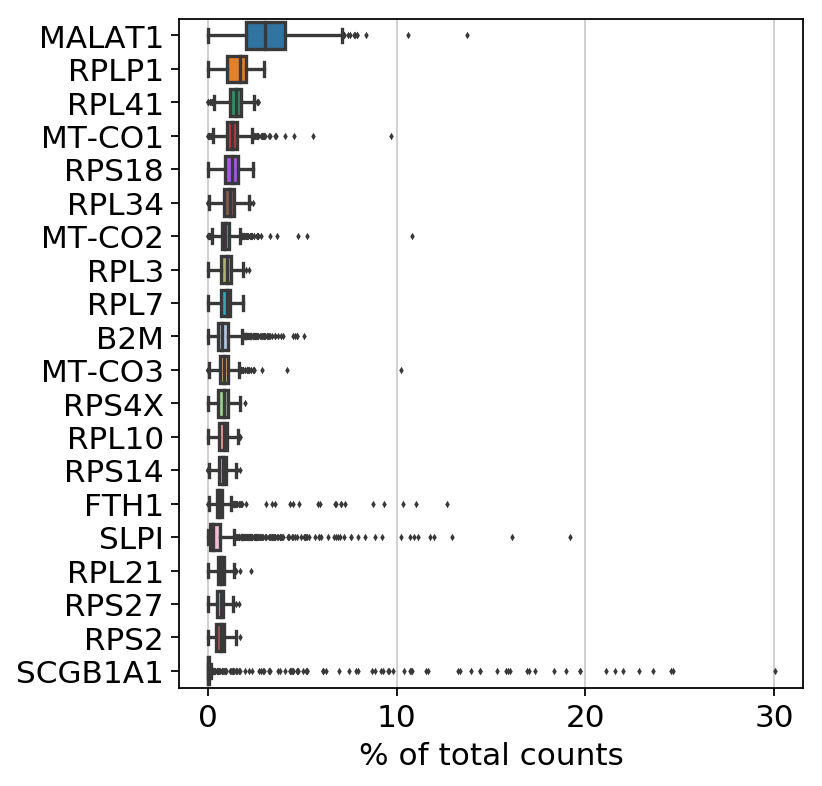

In [121]:
sc.pl.highest_expr_genes(D363_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


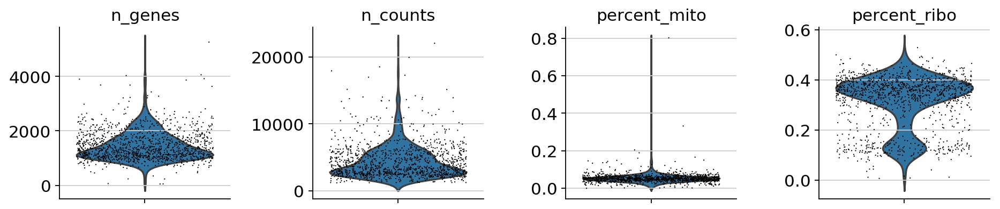

In [122]:
sc.pp.filter_cells(D363_Biop_Int2, min_genes=0)
mito_genes = D363_Biop_Int2.var_names.str.startswith('MT-')
D363_Biop_Int2.obs['percent_mito'] = np.sum(
    D363_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D363_Biop_Int2.X, axis=1).A1
D363_Biop_Int2.obs['n_counts'] = D363_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Biop_Int2.to_df())
ribo_genes = D363_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D363_Biop_Int2.obs['percent_ribo'] = np.sum(
    D363_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Biop_Int2.X, axis=1).A1
D363_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [123]:
sc.pp.filter_cells(D363_Biop_Int2, min_genes=500)
D363_Biop_Int2 = D363_Biop_Int2[D363_Biop_Int2.obs['n_counts'] < 15000, :]
D363_Biop_Int2 = D363_Biop_Int2[D363_Biop_Int2.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D363_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Biop_Int2) # log transform the data
D363_Biop_Int2.raw = D363_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 10 cells that have less than 500 genes expressed


In [124]:
D363_Biop_Int2 = D363_Biop_Int2[:, D363_Biop_Int2.var['ribo_genes']]
D363_Biop_Int2

View of AnnData object with n_obs × n_vars = 1270 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [125]:
D367_Biop_Int1 = sc.read_10x_mtx(
    './D367_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Biop_Int1.var_names_make_unique()
D367_Biop_Int1.obs['manip'] = 'D367_Biop_Int1'
D367_Biop_Int1.obs['position'] = 'Intermediate'
D367_Biop_Int1.obs['method'] = 'Biopsy'
D367_Biop_Int1.obs['donor'] = 'D367'
D367_Biop_Int1.obs['name'] = ['D367_Biop_Int1_' + s for s in list(D367_Biop_Int1.obs.index)]
D367_Biop_Int1.obs_names = D367_Biop_Int1.obs['name']
D367_Biop_Int1

... reading from cache file ./cache/D367_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2310 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

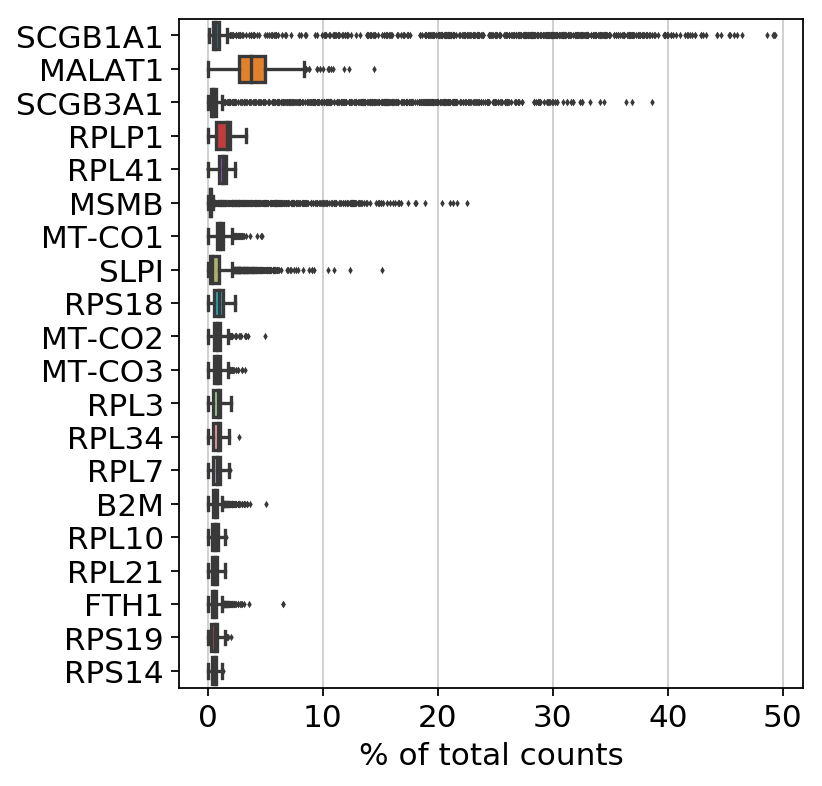

In [126]:
sc.pl.highest_expr_genes(D367_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


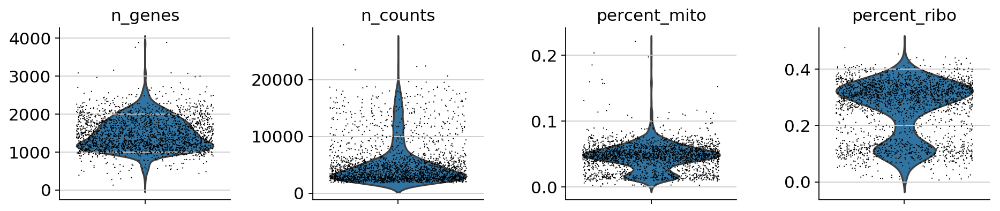

In [127]:
sc.pp.filter_cells(D367_Biop_Int1, min_genes=0)
mito_genes = D367_Biop_Int1.var_names.str.startswith('MT-')
D367_Biop_Int1.obs['percent_mito'] = np.sum(
    D367_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Biop_Int1.X, axis=1).A1
D367_Biop_Int1.obs['n_counts'] = D367_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Biop_Int1.to_df())
ribo_genes = D367_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D367_Biop_Int1.obs['percent_ribo'] = np.sum(
    D367_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Biop_Int1.X, axis=1).A1
D367_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [128]:
sc.pp.filter_cells(D367_Biop_Int1, min_genes=500)
D367_Biop_Int1 = D367_Biop_Int1[D367_Biop_Int1.obs['n_counts'] < 20000, :]
D367_Biop_Int1 = D367_Biop_Int1[D367_Biop_Int1.obs['percent_mito'] < 0.1, :]
sc.pp.normalize_per_cell(D367_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Biop_Int1) # log transform the data
D367_Biop_Int1.raw = D367_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 12 cells that have less than 500 genes expressed


In [129]:
D367_Biop_Int1 = D367_Biop_Int1[:, D367_Biop_Int1.var['ribo_genes']]
D367_Biop_Int1

View of AnnData object with n_obs × n_vars = 2268 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [130]:
D372_Biop_Int1 = sc.read_10x_mtx(
    './D372_Biop_Int1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Int1.var_names_make_unique()
D372_Biop_Int1.obs['manip'] = 'D372_Biop_Int1'
D372_Biop_Int1.obs['position'] = 'Intermediate'
D372_Biop_Int1.obs['method'] = 'Biopsy'
D372_Biop_Int1.obs['donor'] = 'D372'
D372_Biop_Int1.obs['name'] = ['D372_Biop_Int1_' + s for s in list(D372_Biop_Int1.obs.index)]
D372_Biop_Int1.obs_names = D372_Biop_Int1.obs['name']
D372_Biop_Int1

... reading from cache file ./cache/D372_Biop_Int1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1255 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

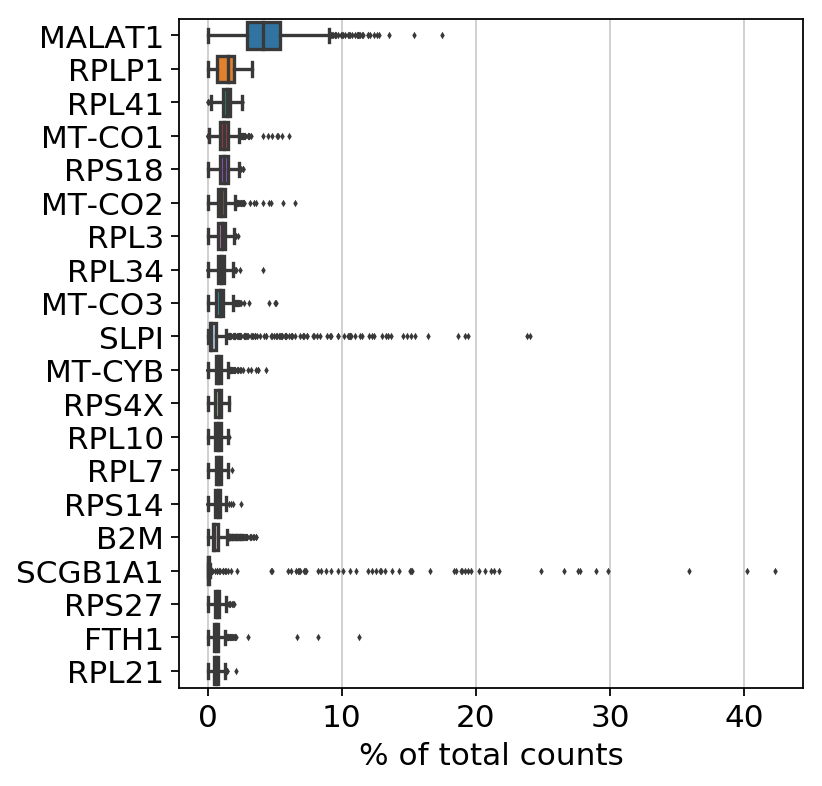

In [131]:
sc.pl.highest_expr_genes(D372_Biop_Int1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


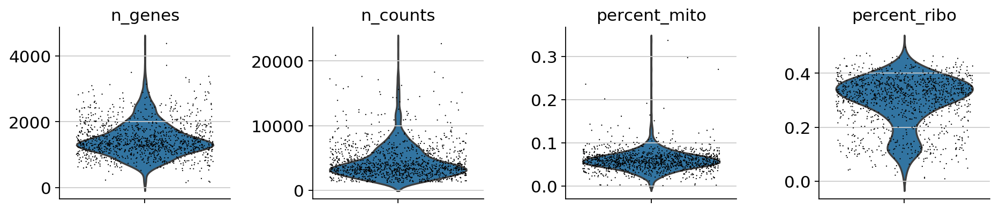

In [132]:
sc.pp.filter_cells(D372_Biop_Int1, min_genes=0)
mito_genes = D372_Biop_Int1.var_names.str.startswith('MT-')
D372_Biop_Int1.obs['percent_mito'] = np.sum(
    D372_Biop_Int1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Int1.X, axis=1).A1
D372_Biop_Int1.obs['n_counts'] = D372_Biop_Int1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Int1.to_df())
ribo_genes = D372_Biop_Int1.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Int1.obs['percent_ribo'] = np.sum(
    D372_Biop_Int1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Int1.X, axis=1).A1
D372_Biop_Int1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Int1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [133]:
sc.pp.filter_cells(D372_Biop_Int1, min_genes=500)
D372_Biop_Int1 = D372_Biop_Int1[D372_Biop_Int1.obs['n_counts'] < 20000, :]
D372_Biop_Int1 = D372_Biop_Int1[D372_Biop_Int1.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D372_Biop_Int1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Int1) # log transform the data
D372_Biop_Int1.raw = D372_Biop_Int1 # freeze the object (for later use of the raw state of it)

filtered out 8 cells that have less than 500 genes expressed


In [134]:
D372_Biop_Int1 = D372_Biop_Int1[:, D372_Biop_Int1.var['ribo_genes']]
D372_Biop_Int1

View of AnnData object with n_obs × n_vars = 1240 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [135]:
D372_Biop_Int2 = sc.read_10x_mtx(
    './D372_Biop_Int2/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Biop_Int2.var_names_make_unique()
D372_Biop_Int2.obs['manip'] = 'D372_Biop_Int2'
D372_Biop_Int2.obs['position'] = 'Intermediate'
D372_Biop_Int2.obs['method'] = 'Biopsy'
D372_Biop_Int2.obs['donor'] = 'D372'
D372_Biop_Int2.obs['name'] = ['D372_Biop_Int2_' + s for s in list(D372_Biop_Int2.obs.index)]
D372_Biop_Int2.obs_names = D372_Biop_Int2.obs['name']
D372_Biop_Int2

... reading from cache file ./cache/D372_Biop_Int2-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4003 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

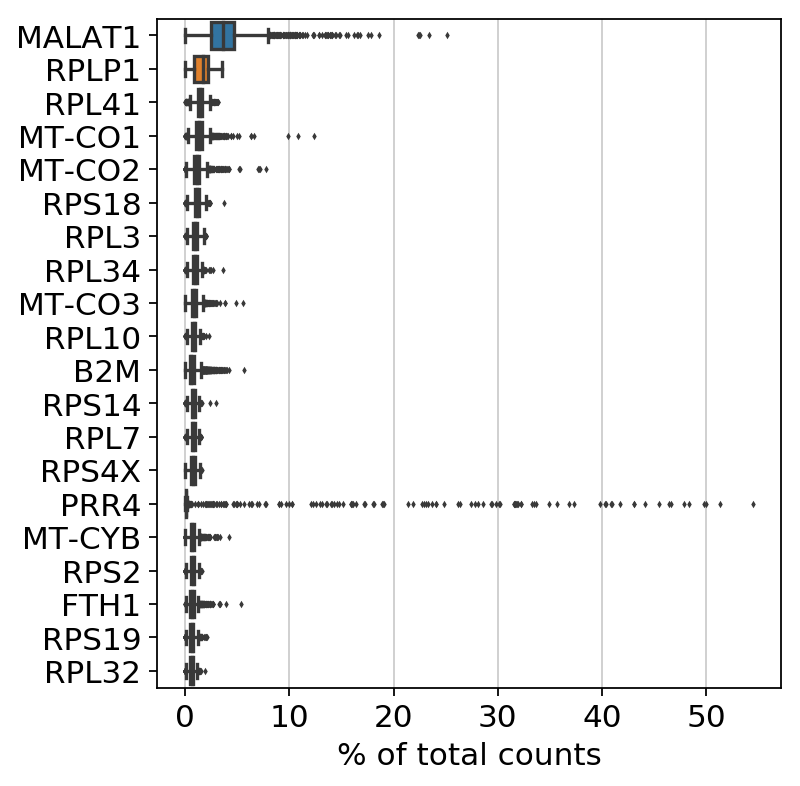

In [136]:
sc.pl.highest_expr_genes(D372_Biop_Int2, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


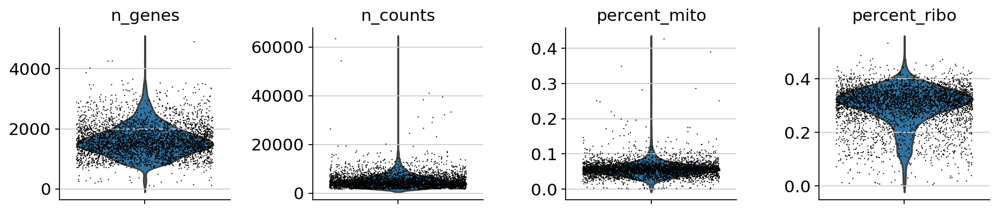

In [137]:
sc.pp.filter_cells(D372_Biop_Int2, min_genes=0)
mito_genes = D372_Biop_Int2.var_names.str.startswith('MT-')
D372_Biop_Int2.obs['percent_mito'] = np.sum(
    D372_Biop_Int2[:, mito_genes].X, axis=1).A1 / np.sum(D372_Biop_Int2.X, axis=1).A1
D372_Biop_Int2.obs['n_counts'] = D372_Biop_Int2.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Biop_Int2.to_df())
ribo_genes = D372_Biop_Int2.to_df().columns.isin(RB_genes_in_df)
D372_Biop_Int2.obs['percent_ribo'] = np.sum(
    D372_Biop_Int2[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Biop_Int2.X, axis=1).A1
D372_Biop_Int2.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Biop_Int2, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [138]:
sc.pp.filter_cells(D372_Biop_Int2, min_genes=500)
D372_Biop_Int2 = D372_Biop_Int2[D372_Biop_Int2.obs['n_counts'] < 20000, :]
D372_Biop_Int2 = D372_Biop_Int2[D372_Biop_Int2.obs['percent_mito'] < 0.2, :]
sc.pp.normalize_per_cell(D372_Biop_Int2, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Biop_Int2) # log transform the data
D372_Biop_Int2.raw = D372_Biop_Int2 # freeze the object (for later use of the raw state of it)

filtered out 25 cells that have less than 500 genes expressed


In [139]:
D372_Biop_Int2 = D372_Biop_Int2[:, D372_Biop_Int2.var['ribo_genes']]
D372_Biop_Int2

View of AnnData object with n_obs × n_vars = 3955 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

# Distal Brushings
[Back to top](#Full-Aggregate)

In [140]:
D326_Brus_Dis1 = sc.read_10x_mtx(
    './D326_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D326_Brus_Dis1.var_names_make_unique()
D326_Brus_Dis1.obs['manip'] = 'D326_Brus_Dis1'
D326_Brus_Dis1.obs['position'] = 'Distal'
D326_Brus_Dis1.obs['method'] = 'Brushing'
D326_Brus_Dis1.obs['donor'] = 'D326'
D326_Brus_Dis1.obs['name'] = ['D326_Brus_Dis1_' + s for s in list(D326_Brus_Dis1.obs.index)]
D326_Brus_Dis1.obs_names = D326_Brus_Dis1.obs['name']
D326_Brus_Dis1

... reading from cache file ./cache/D326_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1250 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

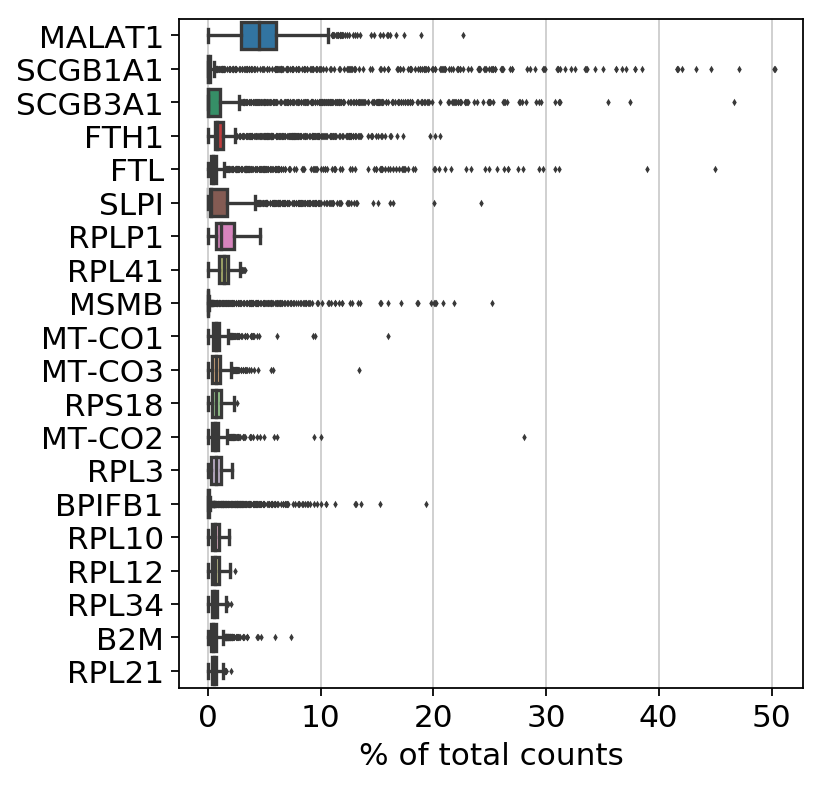

In [141]:
sc.pl.highest_expr_genes(D326_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


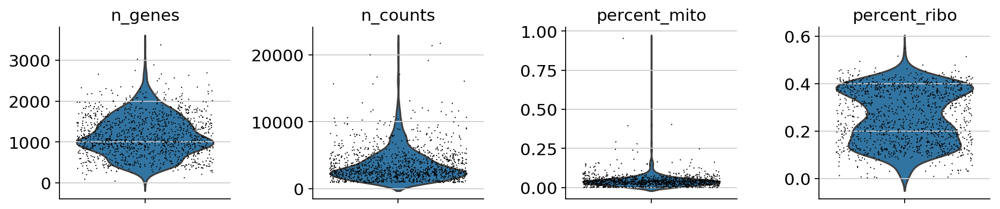

In [142]:
sc.pp.filter_cells(D326_Brus_Dis1, min_genes=0)
mito_genes = D326_Brus_Dis1.var_names.str.startswith('MT-')
D326_Brus_Dis1.obs['percent_mito'] = np.sum(
    D326_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D326_Brus_Dis1.X, axis=1).A1
D326_Brus_Dis1.obs['n_counts'] = D326_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D326_Brus_Dis1.to_df())
ribo_genes = D326_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D326_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D326_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D326_Brus_Dis1.X, axis=1).A1
D326_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D326_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [143]:
sc.pp.filter_cells(D326_Brus_Dis1, min_genes=500)
D326_Brus_Dis1 = D326_Brus_Dis1[D326_Brus_Dis1.obs['n_counts'] < 15000, :]
D326_Brus_Dis1 = D326_Brus_Dis1[D326_Brus_Dis1.obs['percent_mito'] < 0.25 , :]
sc.pp.normalize_per_cell(D326_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D326_Brus_Dis1) # log transform the data
D326_Brus_Dis1.raw = D326_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 126 cells that have less than 500 genes expressed


In [144]:
D326_Brus_Dis1 = D326_Brus_Dis1[:, D326_Brus_Dis1.var['ribo_genes']]
D326_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1114 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [145]:
D337_Brus_Dis1 = sc.read_10x_mtx(
    './D337_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D337_Brus_Dis1.var_names_make_unique()
D337_Brus_Dis1.obs['manip'] = 'D337_Brus_Dis1'
D337_Brus_Dis1.obs['position'] = 'Distal'
D337_Brus_Dis1.obs['method'] = 'Brushing'
D337_Brus_Dis1.obs['donor'] = 'D337'
D337_Brus_Dis1.obs['name'] = ['D337_Brus_Dis1' + s for s in list(D337_Brus_Dis1.obs.index)]
D337_Brus_Dis1.obs_names = D337_Brus_Dis1.obs['name']
D337_Brus_Dis1

... reading from cache file ./cache/D337_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1428 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

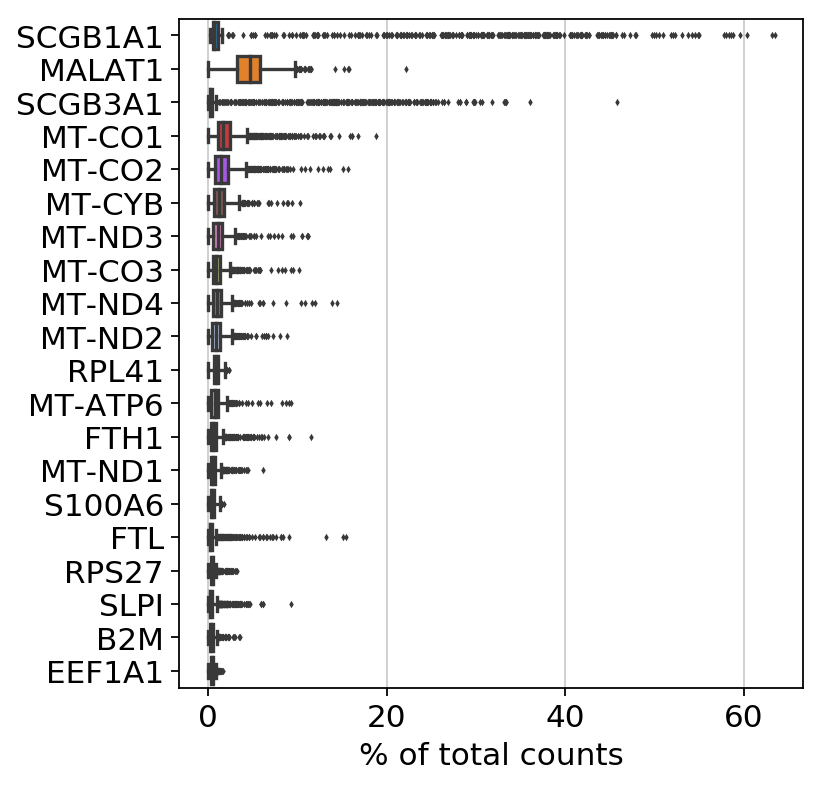

In [146]:
sc.pl.highest_expr_genes(D337_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


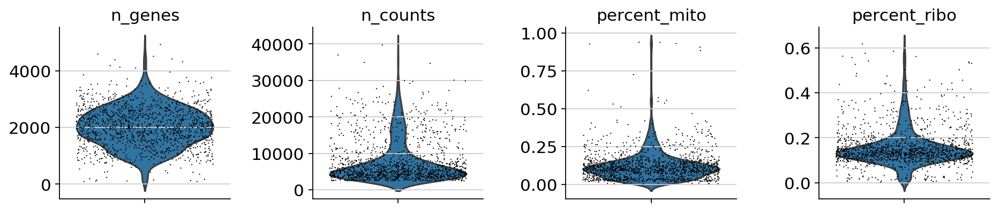

In [147]:
sc.pp.filter_cells(D337_Brus_Dis1, min_genes=0)
mito_genes = D337_Brus_Dis1.var_names.str.startswith('MT-')
D337_Brus_Dis1.obs['percent_mito'] = np.sum(
    D337_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D337_Brus_Dis1.X, axis=1).A1
D337_Brus_Dis1.obs['n_counts'] = D337_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D337_Brus_Dis1.to_df())
ribo_genes = D337_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D337_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D337_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D337_Brus_Dis1.X, axis=1).A1
D337_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D337_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [148]:
sc.pp.filter_cells(D337_Brus_Dis1, min_genes=500)
D337_Brus_Dis1 = D337_Brus_Dis1[D337_Brus_Dis1.obs['n_counts'] < 30000, :]
D337_Brus_Dis1 = D337_Brus_Dis1[D337_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D337_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D337_Brus_Dis1) # log transform the data
D337_Brus_Dis1.raw = D337_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 17 cells that have less than 500 genes expressed


In [149]:
D337_Brus_Dis1 = D337_Brus_Dis1[:, D337_Brus_Dis1.var['ribo_genes']]
D337_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1398 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [150]:
D339_Brus_Dis1 = sc.read_10x_mtx(
    './D339_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D339_Brus_Dis1.var_names_make_unique()
D339_Brus_Dis1.obs['manip'] = 'D339_Brus_Dis1'
D339_Brus_Dis1.obs['position'] = 'Distal'
D339_Brus_Dis1.obs['method'] = 'Brushing'
D339_Brus_Dis1.obs['donor'] = 'D339'
D339_Brus_Dis1.obs['name'] = ['D339_Brus_Dis1_' + s for s in list(D339_Brus_Dis1.obs.index)]
D339_Brus_Dis1.obs_names = D339_Brus_Dis1.obs['name']
D339_Brus_Dis1

... reading from cache file ./cache/D339_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1382 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

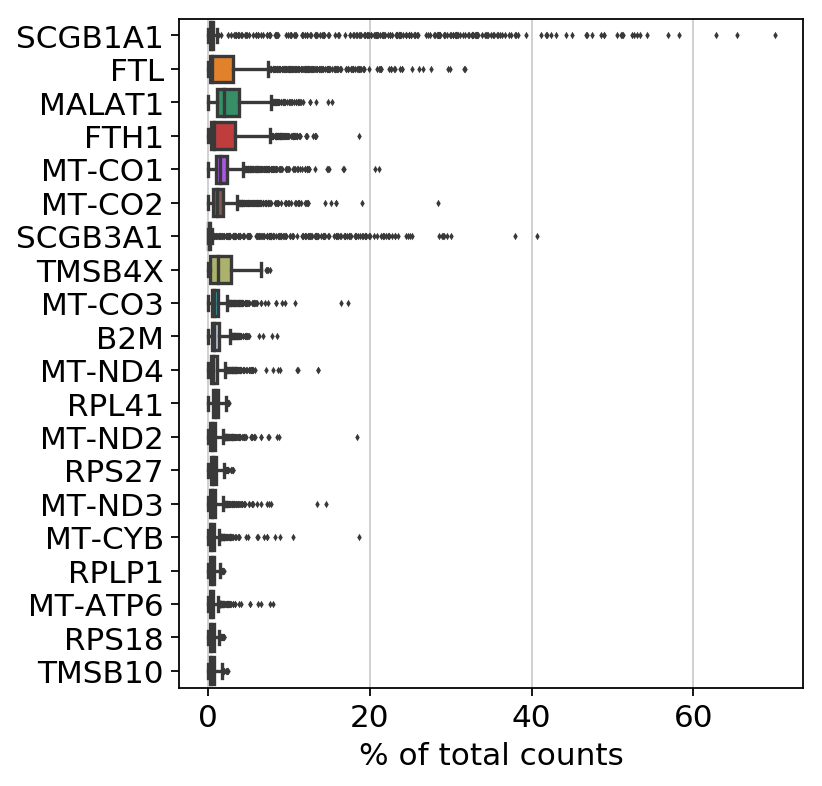

In [151]:
sc.pl.highest_expr_genes(D339_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


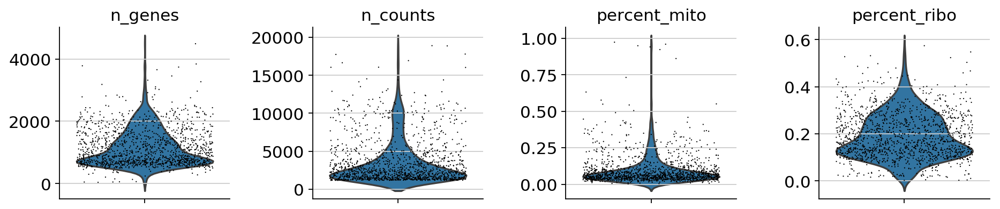

In [152]:
sc.pp.filter_cells(D339_Brus_Dis1, min_genes=0)
mito_genes = D339_Brus_Dis1.var_names.str.startswith('MT-')
D339_Brus_Dis1.obs['percent_mito'] = np.sum(
    D339_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D339_Brus_Dis1.X, axis=1).A1
D339_Brus_Dis1.obs['n_counts'] = D339_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D339_Brus_Dis1.to_df())
ribo_genes = D339_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D339_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D339_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D339_Brus_Dis1.X, axis=1).A1
D339_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D339_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [153]:
sc.pp.filter_cells(D339_Brus_Dis1, min_genes=500)
D339_Brus_Dis1 = D339_Brus_Dis1[D339_Brus_Dis1.obs['n_counts'] < 15000, :]
D339_Brus_Dis1 = D339_Brus_Dis1[D339_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D339_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D339_Brus_Dis1) # log transform the data
D339_Brus_Dis1.raw = D339_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 35 cells that have less than 500 genes expressed


In [154]:
D339_Brus_Dis1 = D339_Brus_Dis1[:, D339_Brus_Dis1.var['ribo_genes']]
D339_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1335 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [155]:
D344_Brus_Dis1 = sc.read_10x_mtx(
    './D344_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D344_Brus_Dis1.var_names_make_unique()
D344_Brus_Dis1.obs['manip'] = 'D344_Brus_Dis1'
D344_Brus_Dis1.obs['position'] = 'Distal'
D344_Brus_Dis1.obs['method'] = 'Brushing'
D344_Brus_Dis1.obs['donor'] = 'D344'
D344_Brus_Dis1.obs['name'] = ['D344_Brus_Dis1_' + s for s in list(D344_Brus_Dis1.obs.index)]
D344_Brus_Dis1.obs_names = D344_Brus_Dis1.obs['name']
D344_Brus_Dis1

... reading from cache file ./cache/D344_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2817 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

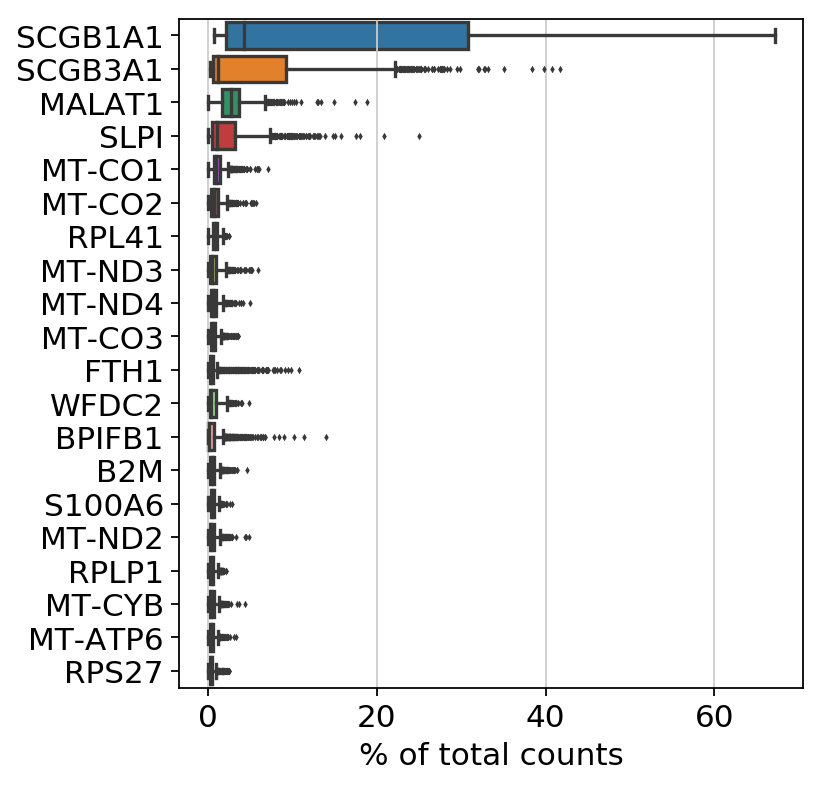

In [156]:
sc.pl.highest_expr_genes(D344_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


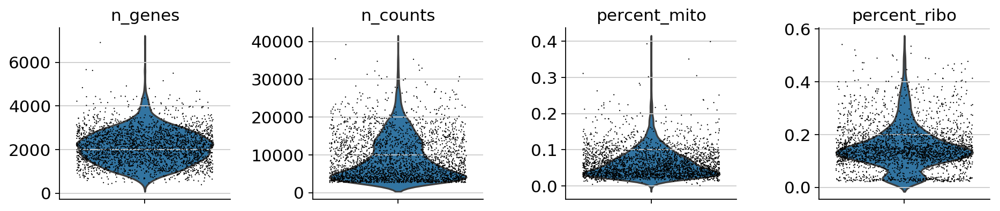

In [157]:
sc.pp.filter_cells(D344_Brus_Dis1, min_genes=0)
mito_genes = D344_Brus_Dis1.var_names.str.startswith('MT-')
D344_Brus_Dis1.obs['percent_mito'] = np.sum(
    D344_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D344_Brus_Dis1.X, axis=1).A1
D344_Brus_Dis1.obs['n_counts'] = D344_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D344_Brus_Dis1.to_df())
ribo_genes = D344_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D344_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D344_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D344_Brus_Dis1.X, axis=1).A1
D344_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D344_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [158]:
sc.pp.filter_cells(D344_Brus_Dis1, min_genes=500)
D344_Brus_Dis1 = D344_Brus_Dis1[D344_Brus_Dis1.obs['n_counts'] < 30000, :]
D344_Brus_Dis1 = D344_Brus_Dis1[D344_Brus_Dis1.obs['percent_mito'] < 0.3 , :]
sc.pp.normalize_per_cell(D344_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D344_Brus_Dis1) # log transform the data
D344_Brus_Dis1.raw = D344_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 8 cells that have less than 500 genes expressed


In [159]:
D344_Brus_Dis1 = D344_Brus_Dis1[:, D344_Brus_Dis1.var['ribo_genes']]
D344_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2789 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [160]:
D353_Brus_Dis1 = sc.read_10x_mtx(
    './D353_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D353_Brus_Dis1.var_names_make_unique()
D353_Brus_Dis1.obs['manip'] = 'D353_Brus_Dis1'
D353_Brus_Dis1.obs['position'] = 'Distal'
D353_Brus_Dis1.obs['method'] = 'Brushing'
D353_Brus_Dis1.obs['donor'] = 'D353'
D353_Brus_Dis1.obs['name'] = ['D353_Brus_Dis1_' + s for s in list(D353_Brus_Dis1.obs.index)]
D353_Brus_Dis1.obs_names = D353_Brus_Dis1.obs['name']
D353_Brus_Dis1

... reading from cache file ./cache/D353_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 4787 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

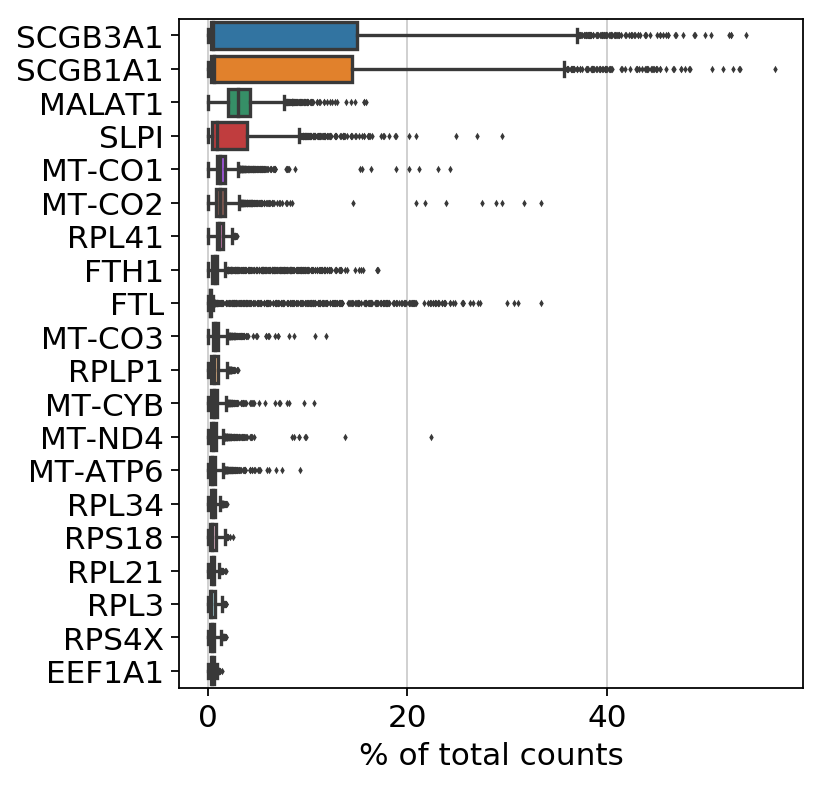

In [161]:
sc.pl.highest_expr_genes(D353_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


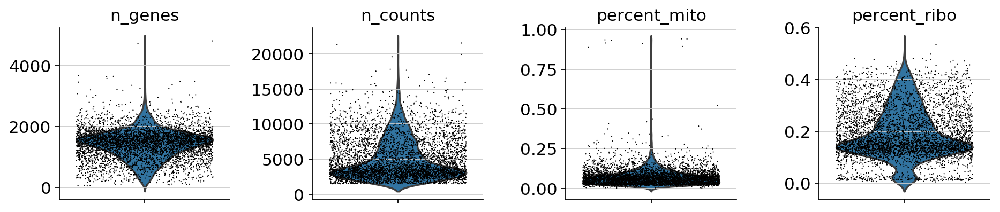

In [162]:
sc.pp.filter_cells(D353_Brus_Dis1, min_genes=0)
mito_genes = D353_Brus_Dis1.var_names.str.startswith('MT-')
D353_Brus_Dis1.obs['percent_mito'] = np.sum(
    D353_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D353_Brus_Dis1.X, axis=1).A1
D353_Brus_Dis1.obs['n_counts'] = D353_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D353_Brus_Dis1.to_df())
ribo_genes = D353_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D353_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D353_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D353_Brus_Dis1.X, axis=1).A1
D353_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D353_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [163]:
sc.pp.filter_cells(D353_Brus_Dis1, min_genes=500)
D353_Brus_Dis1 = D353_Brus_Dis1[D353_Brus_Dis1.obs['n_counts'] < 20000, :]
D353_Brus_Dis1 = D353_Brus_Dis1[D353_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D353_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D353_Brus_Dis1) # log transform the data
D353_Brus_Dis1.raw = D353_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 200 cells that have less than 500 genes expressed


In [164]:
D353_Brus_Dis1 = D353_Brus_Dis1[:, D353_Brus_Dis1.var['ribo_genes']]
D353_Brus_Dis1

View of AnnData object with n_obs × n_vars = 4585 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [165]:
D354_Brus_Dis1 = sc.read_10x_mtx(
    './D354_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D354_Brus_Dis1.var_names_make_unique()
D354_Brus_Dis1.obs['manip'] = 'D354_Brus_Dis1'
D354_Brus_Dis1.obs['position'] = 'Distal'
D354_Brus_Dis1.obs['method'] = 'Brushing'
D354_Brus_Dis1.obs['donor'] = 'D354'
D354_Brus_Dis1.obs['name'] = ['D354_Brus_Dis1_' + s for s in list(D354_Brus_Dis1.obs.index)]
D354_Brus_Dis1.obs_names = D354_Brus_Dis1.obs['name']
D354_Brus_Dis1

... reading from cache file ./cache/D354_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2674 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

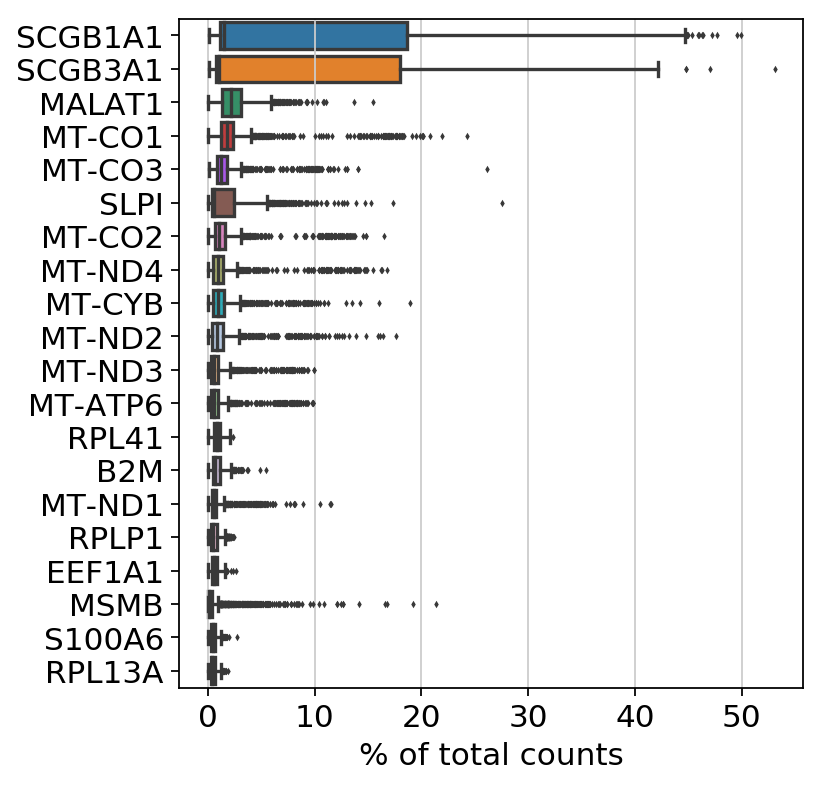

In [166]:
sc.pl.highest_expr_genes(D354_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


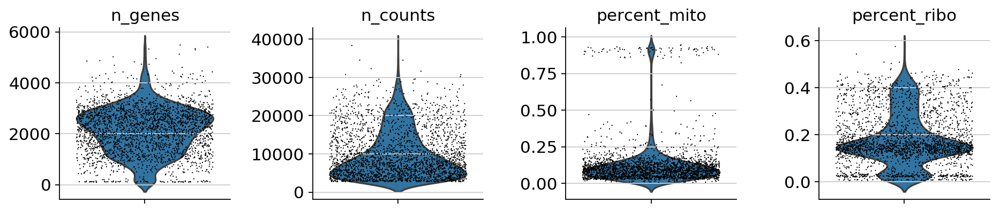

In [167]:
sc.pp.filter_cells(D354_Brus_Dis1, min_genes=0)
mito_genes = D354_Brus_Dis1.var_names.str.startswith('MT-')
D354_Brus_Dis1.obs['percent_mito'] = np.sum(
    D354_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D354_Brus_Dis1.X, axis=1).A1
D354_Brus_Dis1.obs['n_counts'] = D354_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D354_Brus_Dis1.to_df())
ribo_genes = D354_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D354_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D354_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D354_Brus_Dis1.X, axis=1).A1
D354_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D354_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [168]:
sc.pp.filter_cells(D354_Brus_Dis1, min_genes=500)
D354_Brus_Dis1 = D354_Brus_Dis1[D354_Brus_Dis1.obs['n_counts'] < 30000, :]
D354_Brus_Dis1 = D354_Brus_Dis1[D354_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D354_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D354_Brus_Dis1) # log transform the data
D354_Brus_Dis1.raw = D354_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 107 cells that have less than 500 genes expressed


In [169]:
D354_Brus_Dis1 = D354_Brus_Dis1[:, D354_Brus_Dis1.var['ribo_genes']]
D354_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2555 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [170]:
D363_Brus_Dis1 = sc.read_10x_mtx(
    './D363_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D363_Brus_Dis1.var_names_make_unique()
D363_Brus_Dis1.obs['manip'] = 'D363_Brus_Dis1'
D363_Brus_Dis1.obs['position'] = 'Distal'
D363_Brus_Dis1.obs['method'] = 'Brushing'
D363_Brus_Dis1.obs['donor'] = 'D363'
D363_Brus_Dis1.obs['name'] = ['D363_Brus_Dis1_' + s for s in list(D363_Brus_Dis1.obs.index)]
D363_Brus_Dis1.obs_names = D363_Brus_Dis1.obs['name']
D363_Brus_Dis1

... reading from cache file ./cache/D363_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1636 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

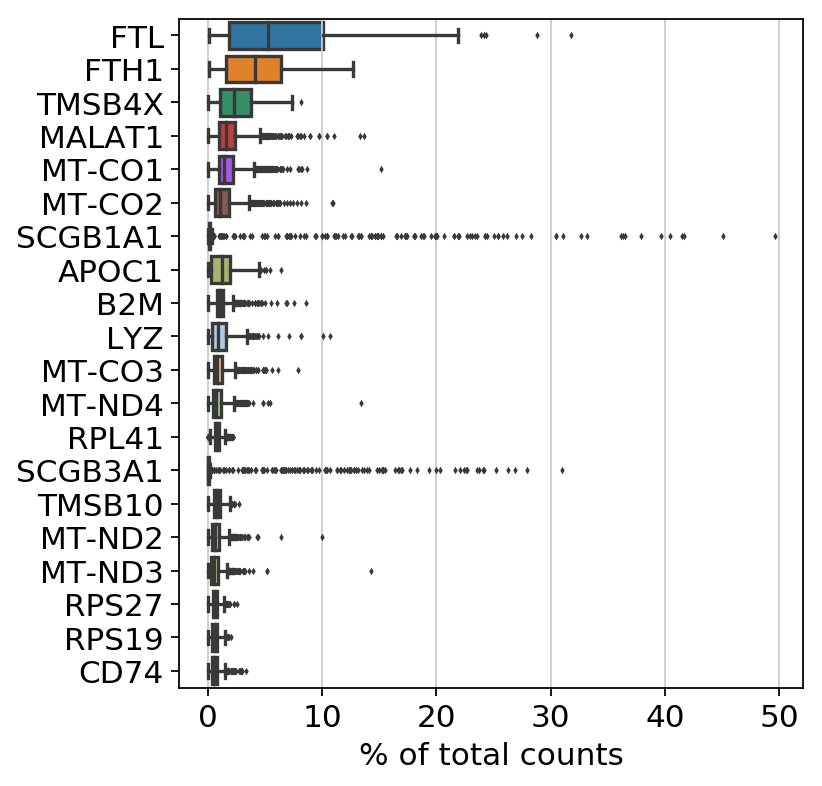

In [171]:
sc.pl.highest_expr_genes(D363_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


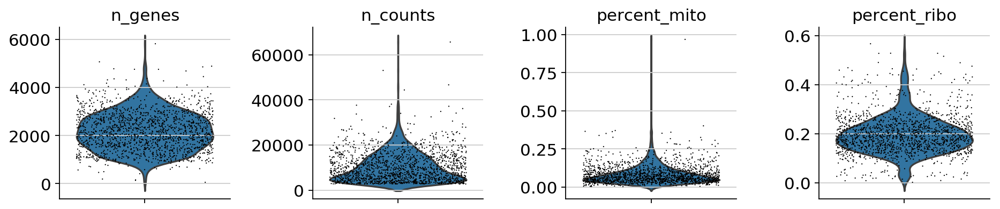

In [172]:
sc.pp.filter_cells(D363_Brus_Dis1, min_genes=0)
mito_genes = D363_Brus_Dis1.var_names.str.startswith('MT-')
D363_Brus_Dis1.obs['percent_mito'] = np.sum(
    D363_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D363_Brus_Dis1.X, axis=1).A1
D363_Brus_Dis1.obs['n_counts'] = D363_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D363_Brus_Dis1.to_df())
ribo_genes = D363_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D363_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D363_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D363_Brus_Dis1.X, axis=1).A1
D363_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D363_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [173]:
sc.pp.filter_cells(D363_Brus_Dis1, min_genes=500)
D363_Brus_Dis1 = D363_Brus_Dis1[D363_Brus_Dis1.obs['n_counts'] < 40000, :]
D363_Brus_Dis1 = D363_Brus_Dis1[D363_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D363_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D363_Brus_Dis1) # log transform the data
D363_Brus_Dis1.raw = D363_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 7 cells that have less than 500 genes expressed


In [174]:
D363_Brus_Dis1 = D363_Brus_Dis1[:, D363_Brus_Dis1.var['ribo_genes']]
D363_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1625 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [175]:
D367_Brus_Dis1 = sc.read_10x_mtx(
    './D367_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D367_Brus_Dis1.var_names_make_unique()
D367_Brus_Dis1.obs['manip'] = 'D367_Brus_Dis1'
D367_Brus_Dis1.obs['position'] = 'Distal'
D367_Brus_Dis1.obs['method'] = 'Brushing'
D367_Brus_Dis1.obs['donor'] = 'D367'
D367_Brus_Dis1.obs['name'] = ['D367_Brus_Dis1_' + s for s in list(D367_Brus_Dis1.obs.index)]
D367_Brus_Dis1.obs_names = D367_Brus_Dis1.obs['name']
D367_Brus_Dis1

... reading from cache file ./cache/D367_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 2192 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

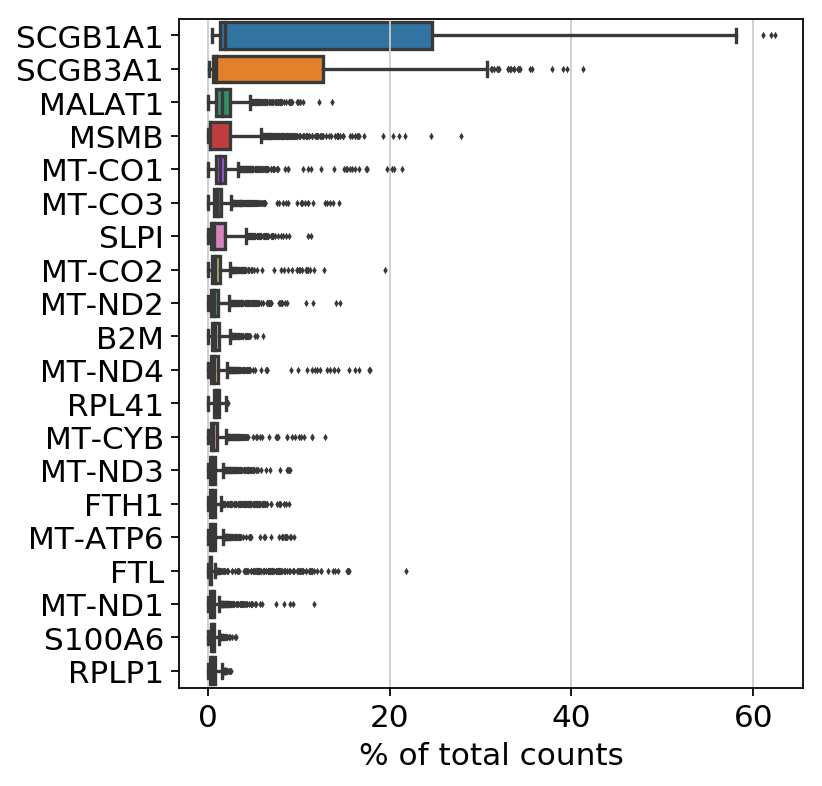

In [176]:
sc.pl.highest_expr_genes(D367_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


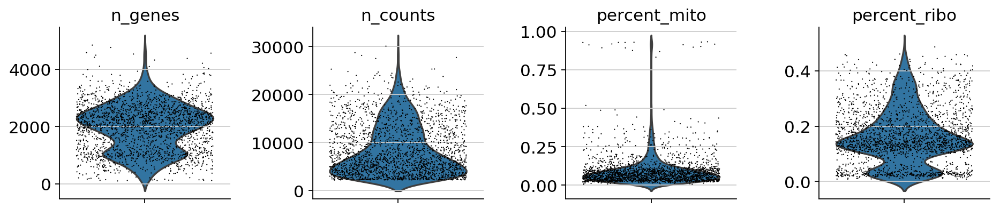

In [177]:
sc.pp.filter_cells(D367_Brus_Dis1, min_genes=0)
mito_genes = D367_Brus_Dis1.var_names.str.startswith('MT-')
D367_Brus_Dis1.obs['percent_mito'] = np.sum(
    D367_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D367_Brus_Dis1.X, axis=1).A1
D367_Brus_Dis1.obs['n_counts'] = D367_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D367_Brus_Dis1.to_df())
ribo_genes = D367_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D367_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D367_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D367_Brus_Dis1.X, axis=1).A1
D367_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D367_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [178]:
sc.pp.filter_cells(D367_Brus_Dis1, min_genes=500)
D367_Brus_Dis1 = D367_Brus_Dis1[D367_Brus_Dis1.obs['n_counts'] < 25000, :]
D367_Brus_Dis1 = D367_Brus_Dis1[D367_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D367_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D367_Brus_Dis1) # log transform the data
D367_Brus_Dis1.raw = D367_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 63 cells that have less than 500 genes expressed


In [179]:
D367_Brus_Dis1 = D367_Brus_Dis1[:, D367_Brus_Dis1.var['ribo_genes']]
D367_Brus_Dis1

View of AnnData object with n_obs × n_vars = 2120 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

In [180]:
D372_Brus_Dis1 = sc.read_10x_mtx(
    './D372_Brus_Dis1/' + outsPath, 
    var_names='gene_symbols', 
    cache=True) 

D372_Brus_Dis1.var_names_make_unique()
D372_Brus_Dis1.obs['manip'] = 'D372_Brus_Dis1'
D372_Brus_Dis1.obs['position'] = 'Distal'
D372_Brus_Dis1.obs['method'] = 'Brushing'
D372_Brus_Dis1.obs['donor'] = 'D372'
D372_Brus_Dis1.obs['name'] = ['D372_Brus_Dis1_' + s for s in list(D372_Brus_Dis1.obs.index)]
D372_Brus_Dis1.obs_names = D372_Brus_Dis1.obs['name']
D372_Brus_Dis1

... reading from cache file ./cache/D372_Brus_Dis1-outs-filtered_gene_bc_matrices-ucagenomix-cellranger-hg19-1.3.0-matrix.h5ad


AnnData object with n_obs × n_vars = 1755 × 32739 
    obs: 'manip', 'position', 'method', 'donor', 'name'
    var: 'gene_ids'

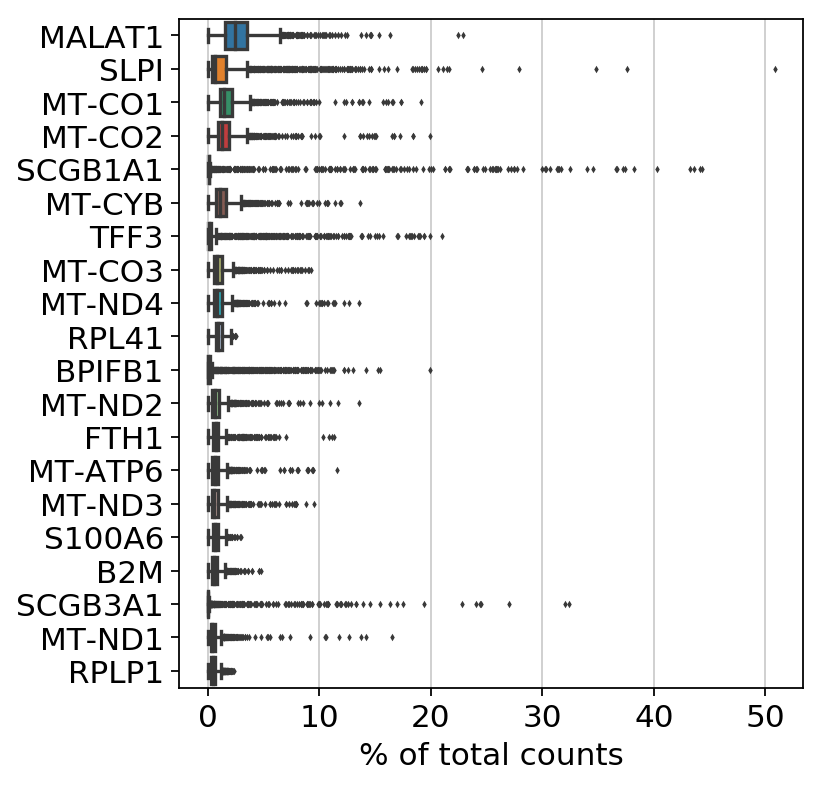

In [181]:
sc.pl.highest_expr_genes(D372_Brus_Dis1, n_top=20)

... storing 'manip' as categorical
... storing 'position' as categorical
... storing 'method' as categorical
... storing 'donor' as categorical


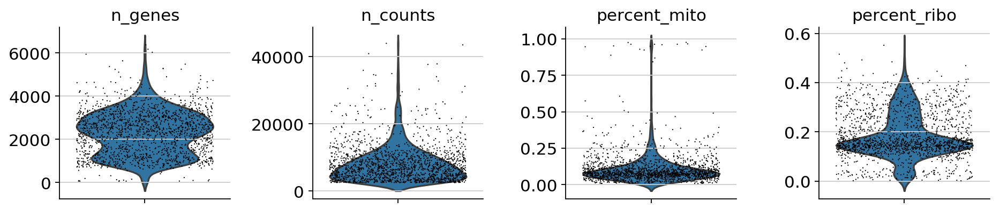

In [182]:
sc.pp.filter_cells(D372_Brus_Dis1, min_genes=0)
mito_genes = D372_Brus_Dis1.var_names.str.startswith('MT-')
D372_Brus_Dis1.obs['percent_mito'] = np.sum(
    D372_Brus_Dis1[:, mito_genes].X, axis=1).A1 / np.sum(D372_Brus_Dis1.X, axis=1).A1
D372_Brus_Dis1.obs['n_counts'] = D372_Brus_Dis1.X.sum(axis=1).A1
df_RB_depleted, counts_removed_per_cell, RB_genes_in_df = remove_RB_genes(D372_Brus_Dis1.to_df())
ribo_genes = D372_Brus_Dis1.to_df().columns.isin(RB_genes_in_df)
D372_Brus_Dis1.obs['percent_ribo'] = np.sum(
    D372_Brus_Dis1[:, ribo_genes].X, axis=1).A1 / np.sum(D372_Brus_Dis1.X, axis=1).A1
D372_Brus_Dis1.var['ribo_genes'] = [not i for i in ribo_genes]

sc.pl.violin(D372_Brus_Dis1, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'],
             jitter=0.4, multi_panel=True)

In [183]:
sc.pp.filter_cells(D372_Brus_Dis1, min_genes=500)
D372_Brus_Dis1 = D372_Brus_Dis1[D372_Brus_Dis1.obs['n_counts'] < 30000, :]
D372_Brus_Dis1 = D372_Brus_Dis1[D372_Brus_Dis1.obs['percent_mito'] < 0.5 , :]
sc.pp.normalize_per_cell(D372_Brus_Dis1, counts_per_cell_after=1e4) # Normalize all data
sc.pp.log1p(D372_Brus_Dis1) # log transform the data
D372_Brus_Dis1.raw = D372_Brus_Dis1 # freeze the object (for later use of the raw state of it)

filtered out 19 cells that have less than 500 genes expressed


In [184]:
D372_Brus_Dis1 = D372_Brus_Dis1[:, D372_Brus_Dis1.var['ribo_genes']]
D372_Brus_Dis1

View of AnnData object with n_obs × n_vars = 1715 × 32568 
    obs: 'manip', 'position', 'method', 'donor', 'name', 'n_genes', 'percent_mito', 'n_counts', 'percent_ribo'
    var: 'gene_ids', 'ribo_genes'

***

# Concatenate full dataset
[Back to top](#Full-Aggregate)

In [185]:
adata = D322_Biop_Nas1.concatenate(D322_Biop_Pro1, D322_Biop_Int1, 
                                   D326_Biop_Pro1, D326_Biop_Int1, D326_Brus_Dis1,
                                   D337_Brus_Dis1,
                                   D339_Biop_Nas1, D339_Biop_Pro1, D339_Biop_Int1, D339_Brus_Dis1,
                                   D344_Biop_Nas1, D344_Biop_Pro1, D344_Biop_Int1, D344_Brus_Dis1,
                                   D345_Biop_Nas1,
                                   D353_Brus_Nas1, D353_Biop_Pro1, D353_Biop_Int2, D353_Brus_Dis1,
                                   D354_Biop_Pro1, D354_Biop_Int2, D354_Brus_Dis1,
                                   D363_Brus_Nas1, D363_Biop_Pro1, D363_Biop_Int2, D363_Brus_Dis1,
                                   D367_Brus_Nas1, D367_Biop_Pro1, D367_Biop_Int1, D367_Brus_Dis1,
                                   D372_Brus_Nas1, D372_Biop_Pro1, D372_Biop_Int1, D372_Biop_Int2, D372_Brus_Dis1,
                                   join='inner')

In [186]:
adata.write('./Data/PreProcessed_preliminary_dataset.h5ad')

... storing 'donor' as categorical
... storing 'manip' as categorical
... storing 'method' as categorical
... storing 'position' as categorical
